<a href="https://colab.research.google.com/github/Mattheusrrn/PUC/blob/main/Deep_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


 **MVP**

O objetivo é treinar o modelo para identificar raças de cachorros.

O link para o desafio: https://www.kaggle.com/datasets/mohamedchahed/dog-breeds

Trata-se de um problema de classificação com uso de visão computacional, sendo necessário o uso de deep learning.


1.0 **Bibliotecas**


In [20]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import sklearn.metrics as skm
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from IPython.display import Image, display
from datetime import datetime
from sklearn.metrics import confusion_matrix, classification_report
import itertools
import numpy as np
import matplotlib.pyplot as plt

import gdown
from google.colab import drive

import zipfile

2.0 **Funções**

In [21]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    A normalização pode ser aplicada definindo `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusão normalizada")
    else:
        print('Matriz de confusão sem normalização')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predito')

3.0 **Importando os Dados**

In [22]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [23]:
from pathlib import Path

path = Path("/content/drive/MyDrive/Raças/dog-breeds")

print("Number of images in each category:\n")
for directory in path.iterdir():
    print(f"{directory.name}: {len(list(directory.iterdir()))}")

Number of images in each category:

poodle: 56
rottweiler: 78
dalmatian: 51
labrador-retriever: 50
bulldog: 76
beagle: 83
husky: 71
german-shepherd: 76


4.0 **Divisão do Dataset**

Como não houve uma divisão prévia de treino e teste, então foi se necessário fazer algo manual visto que havia também uma pasta para cada classe.

In [25]:
def split_dataset(path, training_pct=0.70, validation_pct=0.20):
    train_df = pd.DataFrame({'path': [], 'category': []})
    test_df = pd.DataFrame({'path': [], 'category': []})
    valid_df = pd.DataFrame({'path': [], 'category': []})

    for category_path in path.iterdir():
        category_name = category_path.name
        images_files = list(category_path.iterdir())

        num_train = int(len(images_files) * training_pct)
        num_valid = int(len(images_files) * validation_pct)

        training_images = images_files[:num_train]
        valid_images = images_files[num_train:(num_train+num_valid)]
        test_images = images_files[(num_train+num_valid):]

        training_images = [os.path.join(category_path, x.name) for x in training_images]
        test_images = [os.path.join(category_path, x.name) for x in test_images]
        valid_images = [os.path.join(category_path, x.name) for x in valid_images]

        train_df = train_df.append(pd.DataFrame({'path': training_images, 'category': category_name}));
        test_df = test_df.append(pd.DataFrame({'path': test_images, 'category': category_name}));
        valid_df = valid_df.append(pd.DataFrame({'path': valid_images, 'category': category_name}));

    return (train_df, test_df, valid_df);

train_df, test_df, valid_df = split_dataset(path);

<ipython-input-25-33d422ca14de>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append(pd.DataFrame({'path': training_images, 'category': category_name}));
<ipython-input-25-33d422ca14de>:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  test_df = test_df.append(pd.DataFrame({'path': test_images, 'category': category_name}));
<ipython-input-25-33d422ca14de>:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  valid_df = valid_df.append(pd.DataFrame({'path': valid_images, 'category': category_name}));
<ipython-input-25-33d422ca14de>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append(pd.DataFra

In [26]:
test_df['category'].value_counts()

rottweiler            9
beagle                9
bulldog               8
husky                 8
german-shepherd       8
poodle                6
dalmatian             6
labrador-retriever    5
Name: category, dtype: int64

5.0 **Preparação dos Dados**



In [27]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

img_height = 224
img_width = 224
batch_size = 32



train_data = ImageDataGenerator(
    rescale=1/255,
    rotation_range=40,
    width_shift_range=0.20,
    height_shift_range=0.20,
    shear_range=0.20,
    horizontal_flip=True,
)

train_datagen = train_data.flow_from_dataframe(
    train_df,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    x_col='path',
    y_col='category',
    class_mode='categorical',
    color_mode='rgb',
    classes=['beagle', 'bulldog', 'dalmatian', 'german-shepherd', 'husky', 'labrador-retriever', 'poodle', 'rottweiler']
)

validation_data = ImageDataGenerator()
validation_datagen = validation_data.flow_from_dataframe(
    valid_df,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    x_col='path',
    y_col='category',
    class_mode='categorical',
    color_mode='rgb',
    classes=['beagle', 'bulldog', 'dalmatian', 'german-shepherd', 'husky', 'labrador-retriever', 'poodle', 'rottweiler']
)


test_data = ImageDataGenerator()
test_datagen = validation_data.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='category',
    class_mode='categorical',
    classes=['beagle', 'bulldog', 'dalmatian', 'german-shepherd', 'husky', 'labrador-retriever', 'poodle', 'rottweiler']
)

Found 376 validated image filenames belonging to 8 classes.
Found 106 validated image filenames belonging to 8 classes.
Found 59 validated image filenames belonging to 8 classes.


In [28]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Dropout
from tensorflow.keras.optimizers import RMSprop

In [29]:
EPOCHS = 25
INIT_LR = 0.001
BS = 32
height=224
width=224
depth=3
numClasses=8

In [30]:
# import the necessary packages
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras import backend as K

model = Sequential()
inputShape = (height, width, depth)

# if we are using "channels first", update the input shape
if K.image_data_format() == "channels_first":
    inputShape = (depth, height, width)

# first set of CONV => RELU => POOL layers
model.add(Conv2D(16, (3, 3), padding="same",input_shape=inputShape))
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# second set of CONV => RELU => POOL layers
model.add(Conv2D(32, (3, 3), padding="same"))
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# third set of CONV => RELU => POOL layers
model.add(Conv2D(64, (3, 3), padding="same"))
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(1024))
model.add(Activation("relu"))

# softmax classifier
model.add(Dense(numClasses))
model.add(Activation("softmax"))

In [31]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 16)      448       
                                                                 
 activation (Activation)     (None, 224, 224, 16)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 32)      4640      
                                                                 
 activation_1 (Activation)   (None, 112, 112, 32)      0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 56, 56, 32)       0         
 2D)                                                    

6.0 **Treinamento do Modelo**

In [32]:
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy'],
)

epochs = 20
history = model.fit(train_datagen, epochs=epochs, validation_data=validation_datagen)

Epoch 1/20
12/12 [==============================] - 204s 17s/step - loss: 5.1349 - accuracy: 0.1277 - val_loss: 22.2174 - val_accuracy: 0.1887
Epoch 2/20
12/12 [==============================] - 53s 4s/step - loss: 2.0549 - accuracy: 0.1835 - val_loss: 38.1894 - val_accuracy: 0.2642
Epoch 3/20
12/12 [==============================] - 48s 4s/step - loss: 2.0131 - accuracy: 0.1729 - val_loss: 29.7769 - val_accuracy: 0.3019
Epoch 4/20
12/12 [==============================] - 55s 4s/step - loss: 1.9566 - accuracy: 0.2367 - val_loss: 32.4147 - val_accuracy: 0.2736
Epoch 5/20
12/12 [==============================] - 47s 4s/step - loss: 1.8318 - accuracy: 0.2872 - val_loss: 73.7918 - val_accuracy: 0.3019
Epoch 6/20
12/12 [==============================] - 47s 4s/step - loss: 1.8216 - accuracy: 0.2660 - val_loss: 51.7456 - val_accuracy: 0.3396
Epoch 7/20
12/12 [==============================] - 49s 4s/step - loss: 1.7249 - accuracy: 0.3431 - val_loss: 77.4580 - val_accuracy: 0.3679
Epoch 8/20


In [33]:
#history = model.fit(
  #  train_datagen,
   # steps_per_epoch=train_datagen.samples // batch_size,
  #  epochs=num_epochs,
   # validation_data=validation_datagen,
   # validation_steps=validation_datagen.samples // batch_size
#)

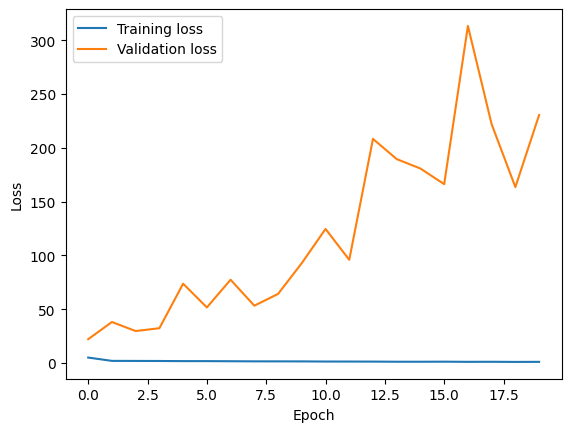

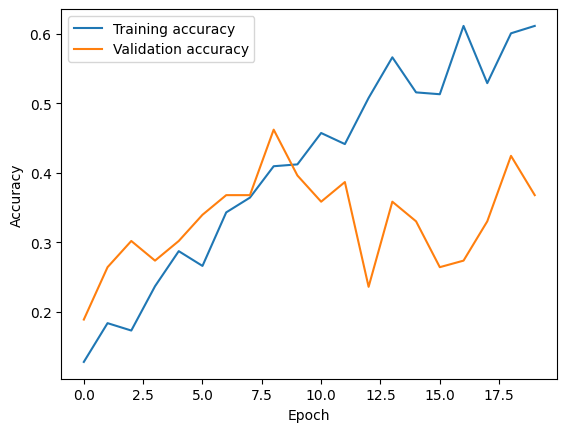

In [34]:
import matplotlib.pyplot as plt

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training accuracy')
plt.plot(history.history['val_accuracy'], label='Validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

Vemos que mesmo com a performance não tão boa no dataset de treino, ainda assim vemos uma performance ainda pior nos dados de validação o que indica certa incapacidade de generalizar previsões em dados novos do nosso modelo.

In [35]:
test_df.head()

,path,category
0,/content/drive/MyDrive/Raças/dog-breeds/poodl...,poodle
1,/content/drive/MyDrive/Raças/dog-breeds/poodl...,poodle
2,/content/drive/MyDrive/Raças/dog-breeds/poodl...,poodle
3,/content/drive/MyDrive/Raças/dog-breeds/poodl...,poodle
4,/content/drive/MyDrive/Raças/dog-breeds/poodl...,poodle


7.0 **Previsão nos dados de Teste**

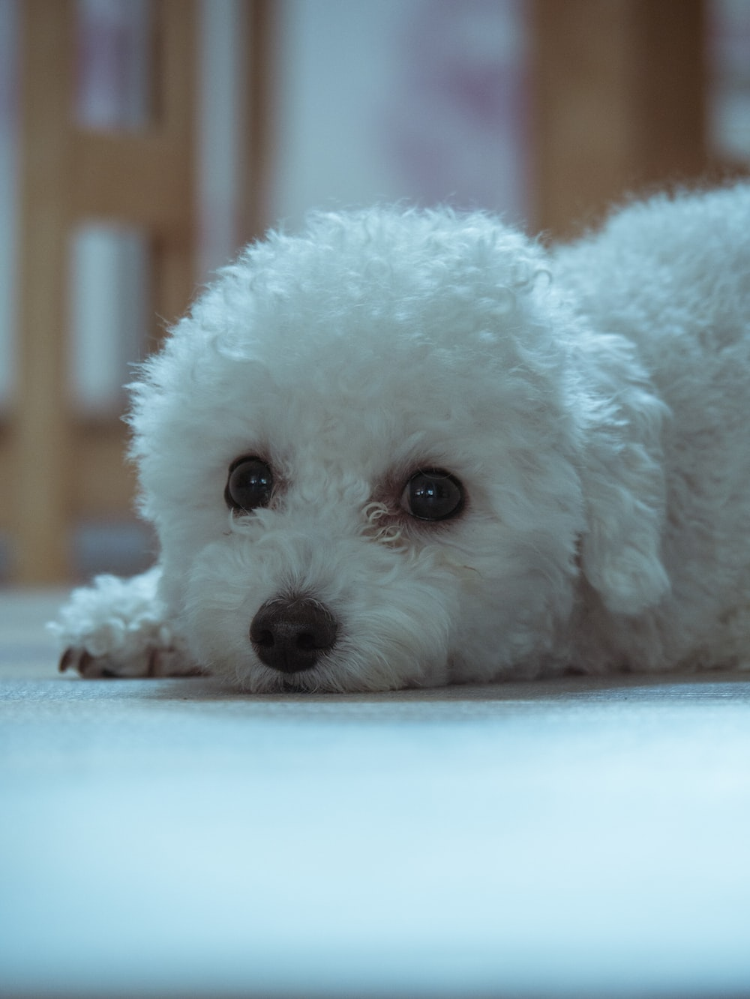

1/1 [==============================] - 0s 178ms/step
Real: poodle
Previsão: german-shepherd
Probabilidade: 0.37418723




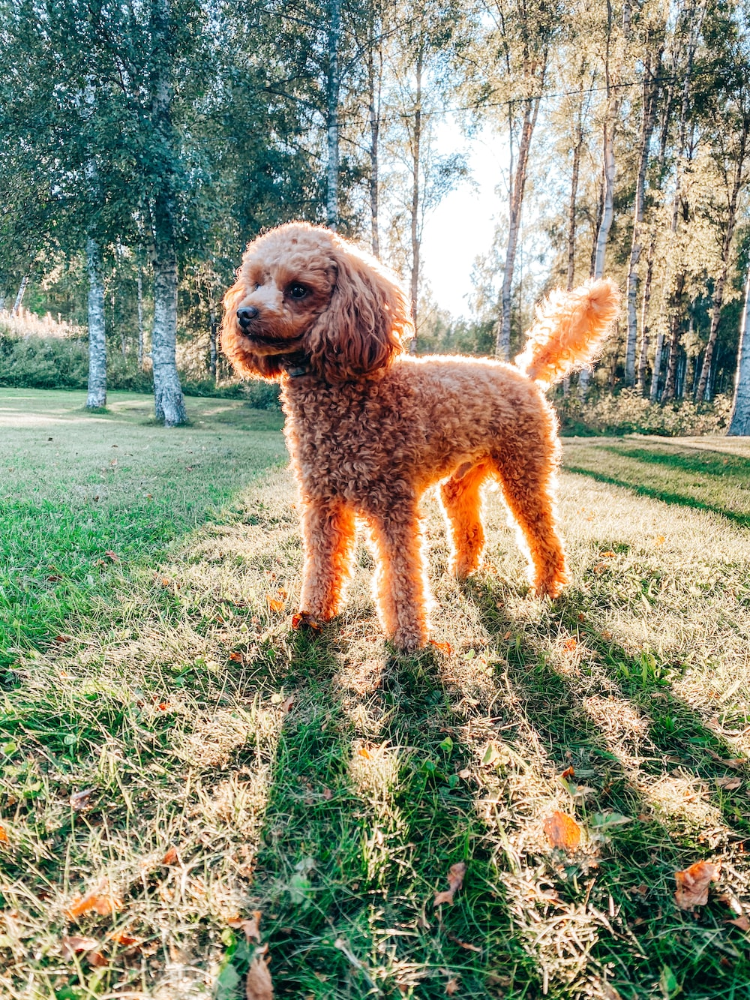

1/1 [==============================] - 0s 67ms/step
Real: poodle
Previsão: poodle
Probabilidade: 0.906438




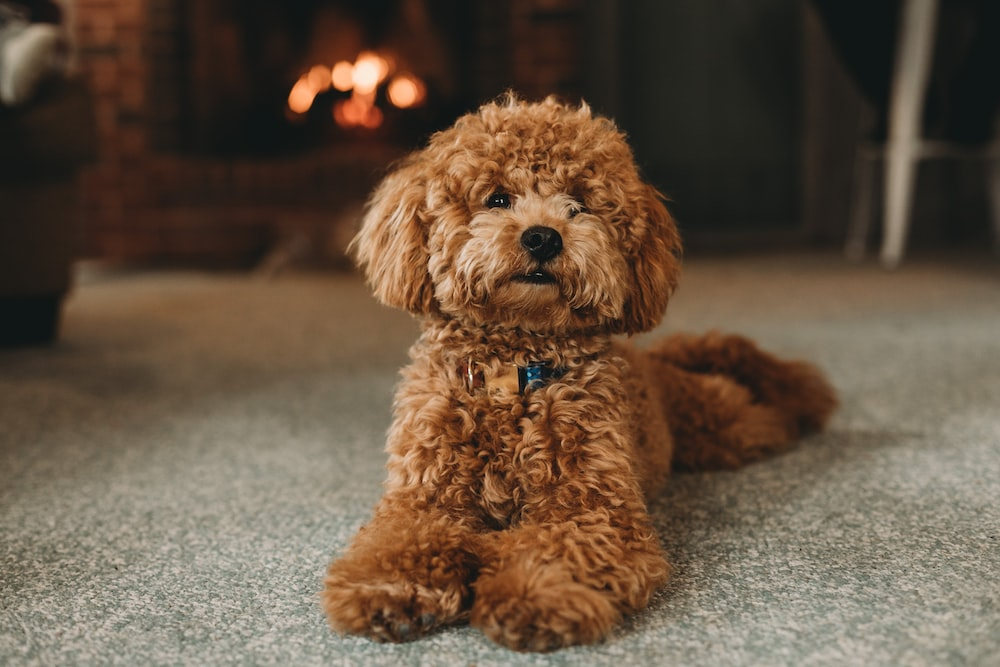

1/1 [==============================] - 0s 54ms/step
Real: poodle
Previsão: poodle
Probabilidade: 0.45891976




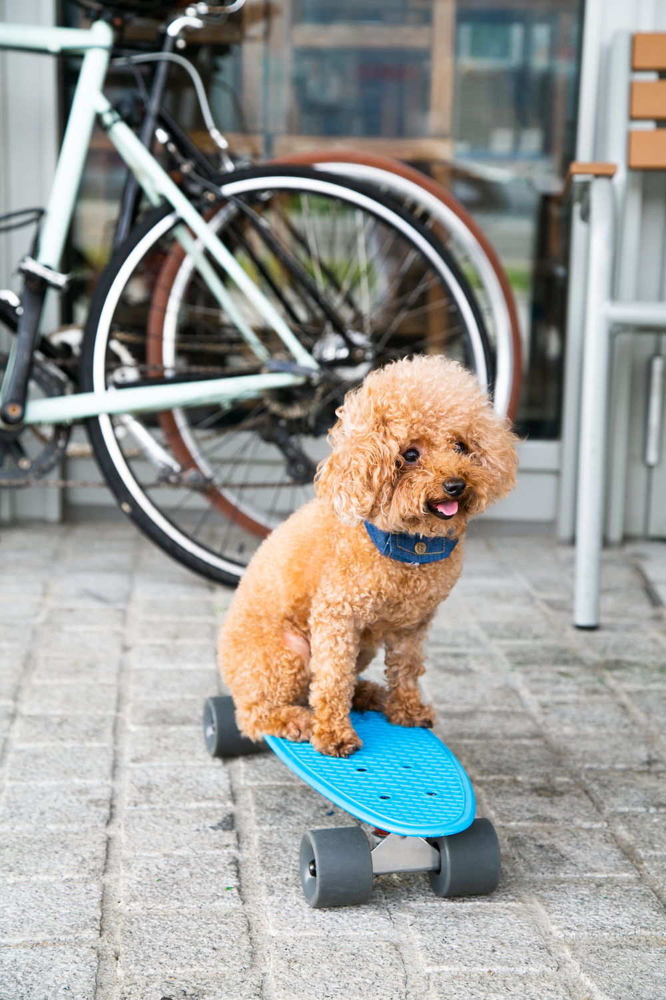

1/1 [==============================] - 0s 82ms/step
Real: poodle
Previsão: rottweiler
Probabilidade: 0.4827175




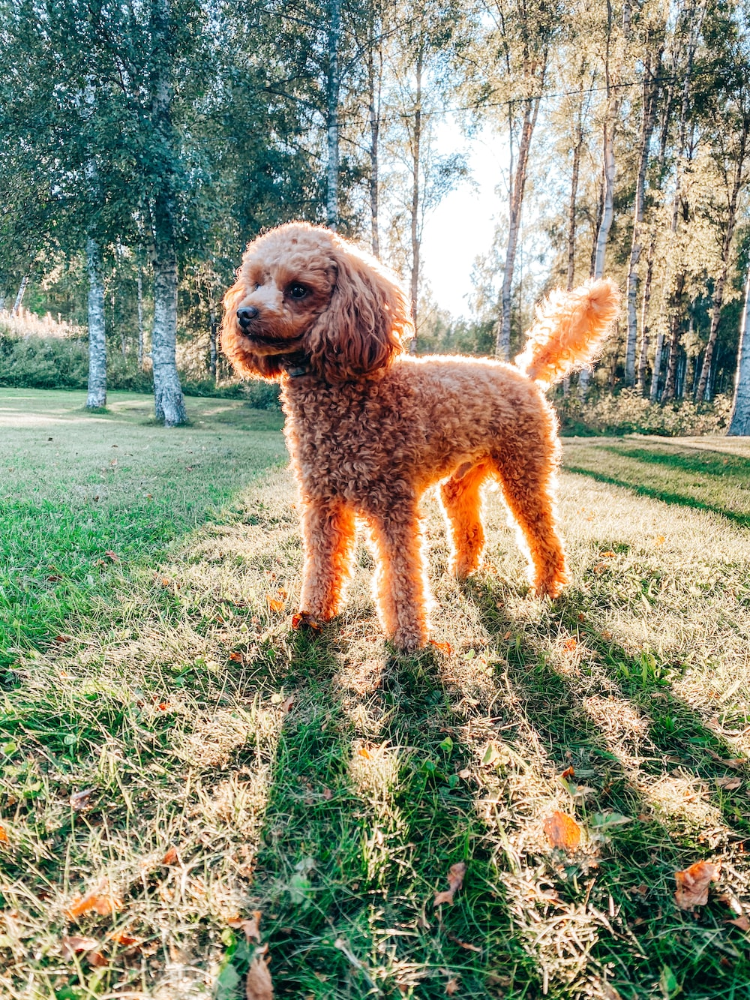

1/1 [==============================] - 0s 91ms/step
Real: poodle
Previsão: poodle
Probabilidade: 0.906438




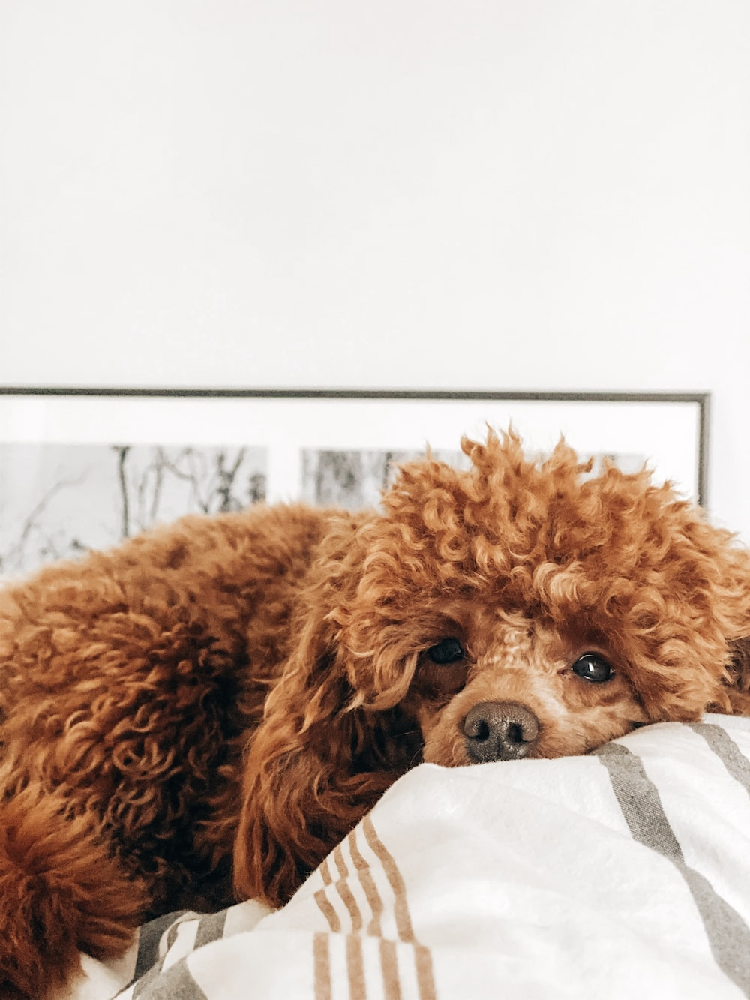

1/1 [==============================] - 0s 60ms/step
Real: poodle
Previsão: bulldog
Probabilidade: 0.3650282




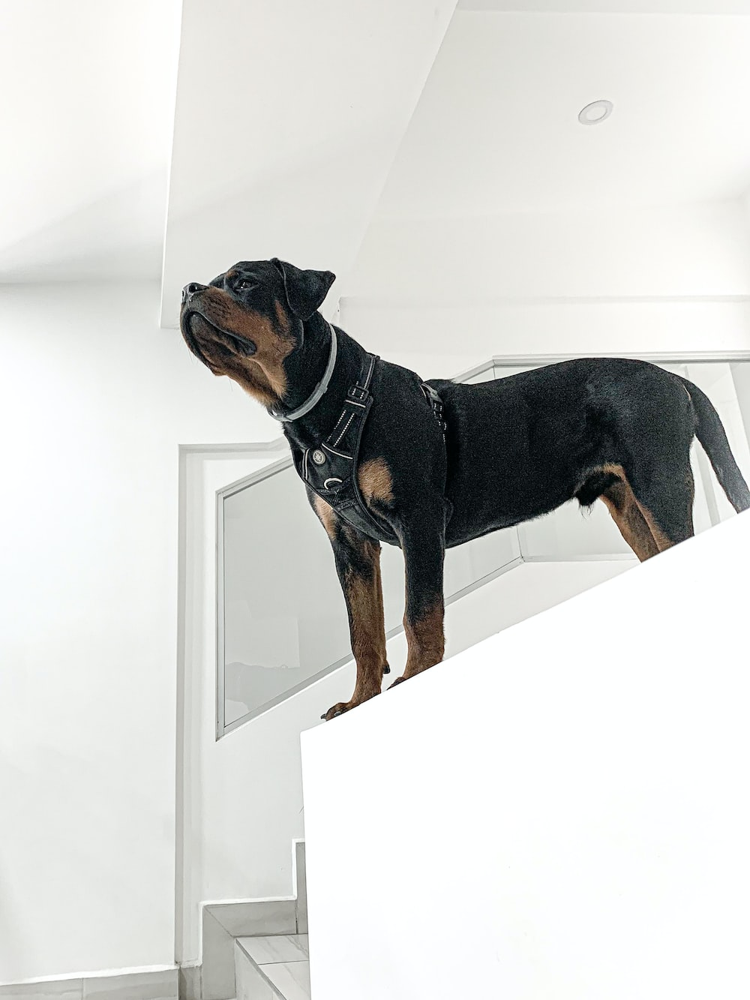

1/1 [==============================] - 0s 62ms/step
Real: rottweiler
Previsão: dalmatian
Probabilidade: 0.8924701




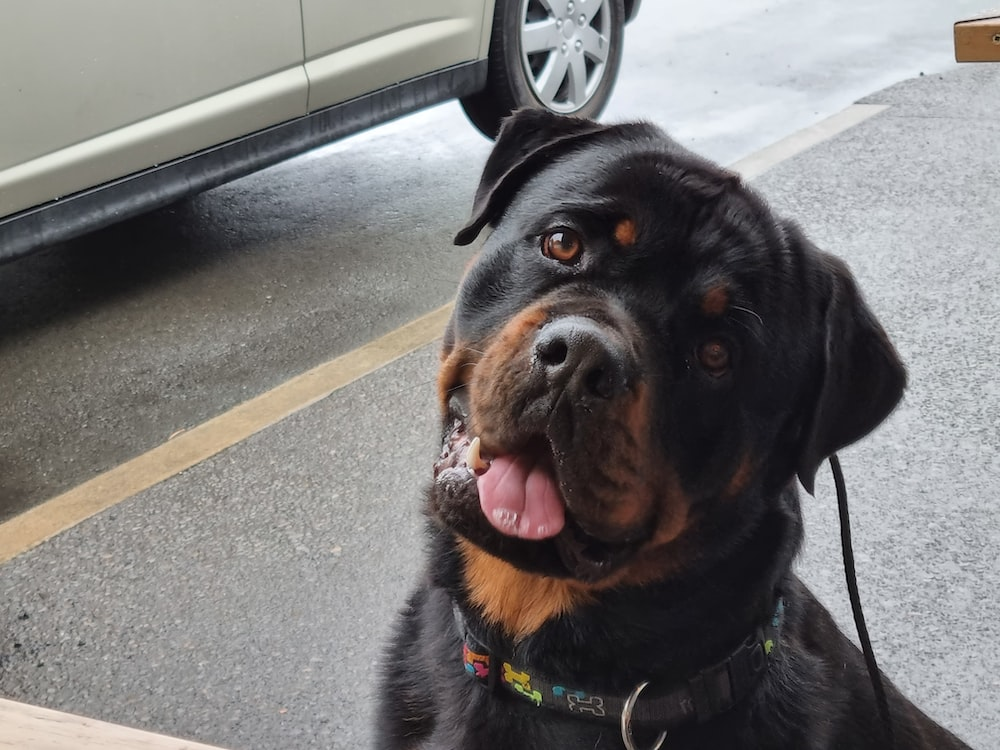

1/1 [==============================] - 0s 63ms/step
Real: rottweiler
Previsão: rottweiler
Probabilidade: 0.98388726




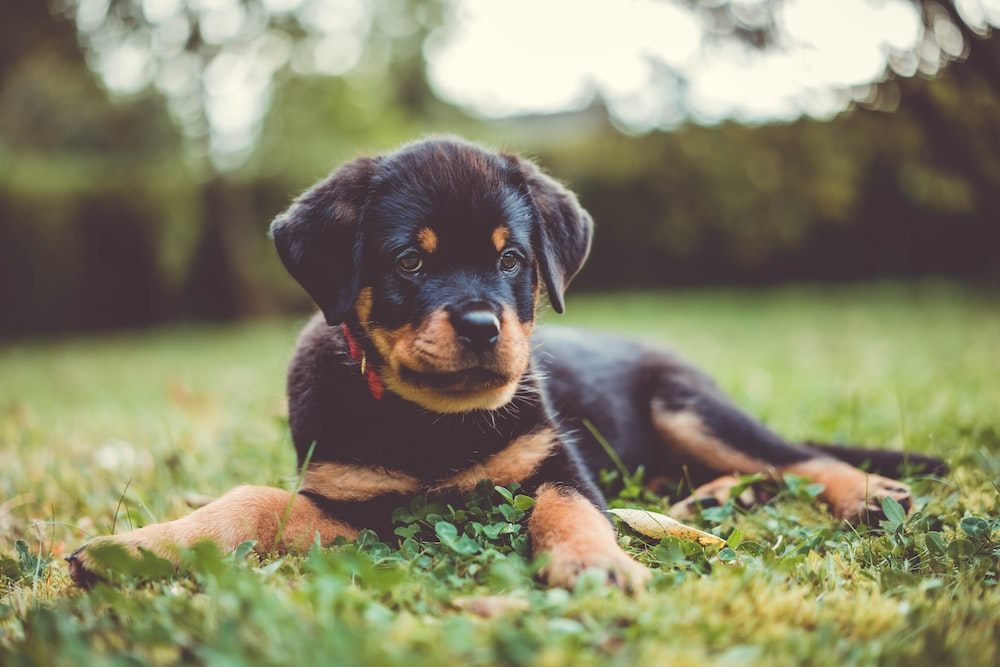

1/1 [==============================] - 0s 63ms/step
Real: rottweiler
Previsão: german-shepherd
Probabilidade: 0.48557422




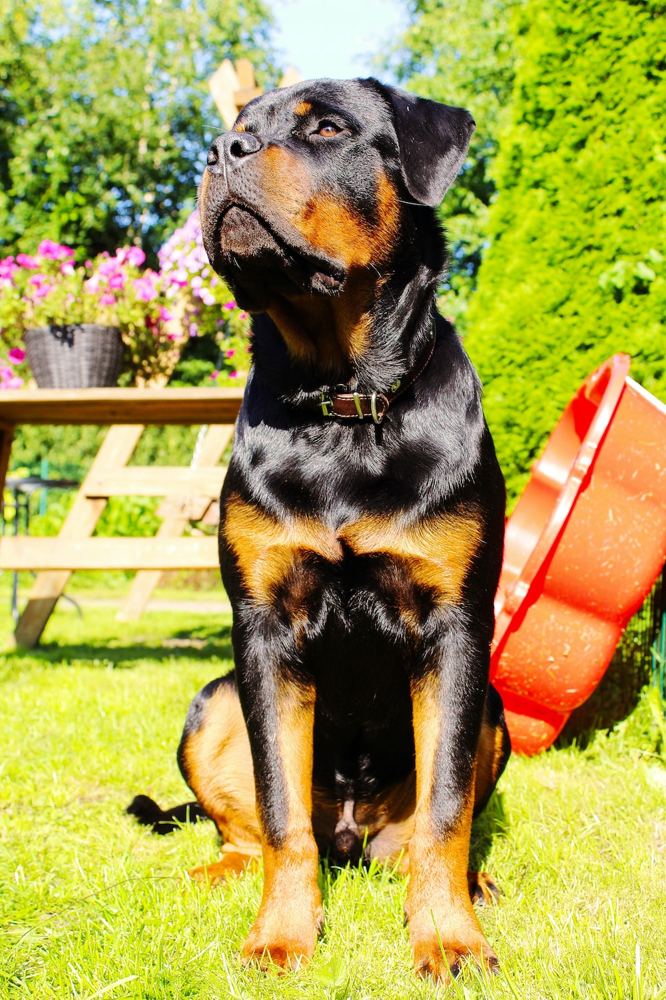

1/1 [==============================] - 0s 77ms/step
Real: rottweiler
Previsão: rottweiler
Probabilidade: 0.3133948




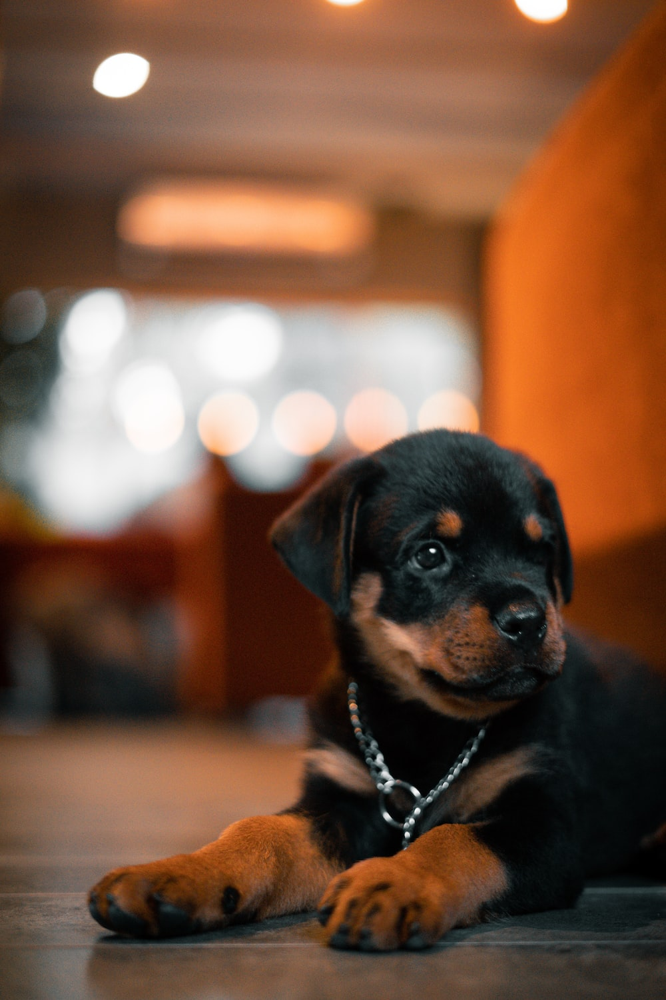

1/1 [==============================] - 0s 71ms/step
Real: rottweiler
Previsão: beagle
Probabilidade: 0.5187629




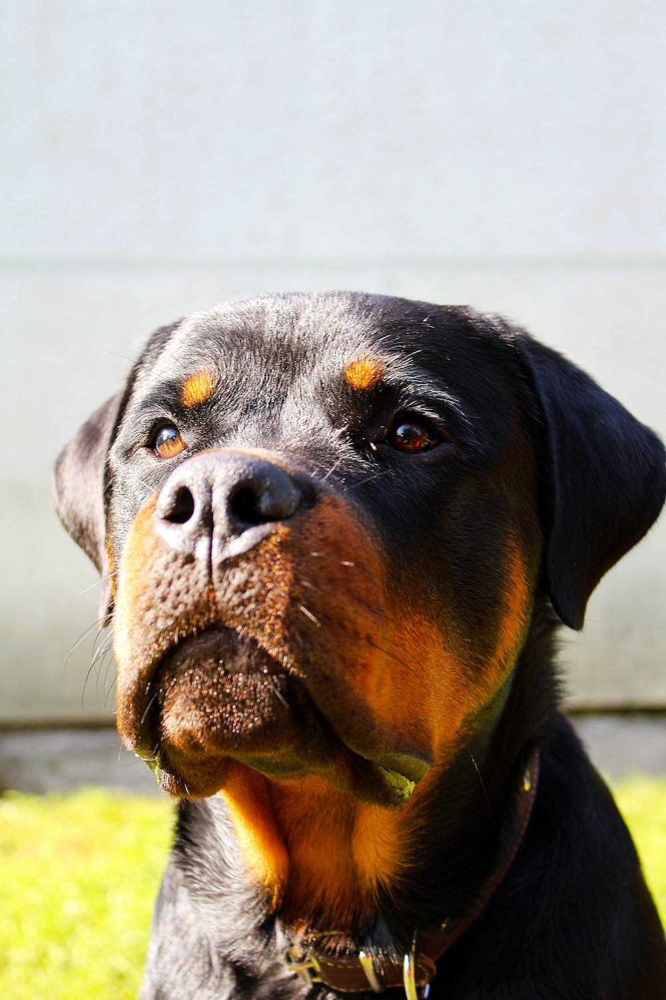

1/1 [==============================] - 0s 65ms/step
Real: rottweiler
Previsão: rottweiler
Probabilidade: 0.95941174




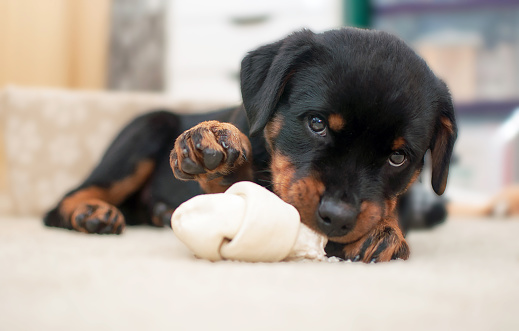

1/1 [==============================] - 0s 69ms/step
Real: rottweiler
Previsão: rottweiler
Probabilidade: 0.93763554




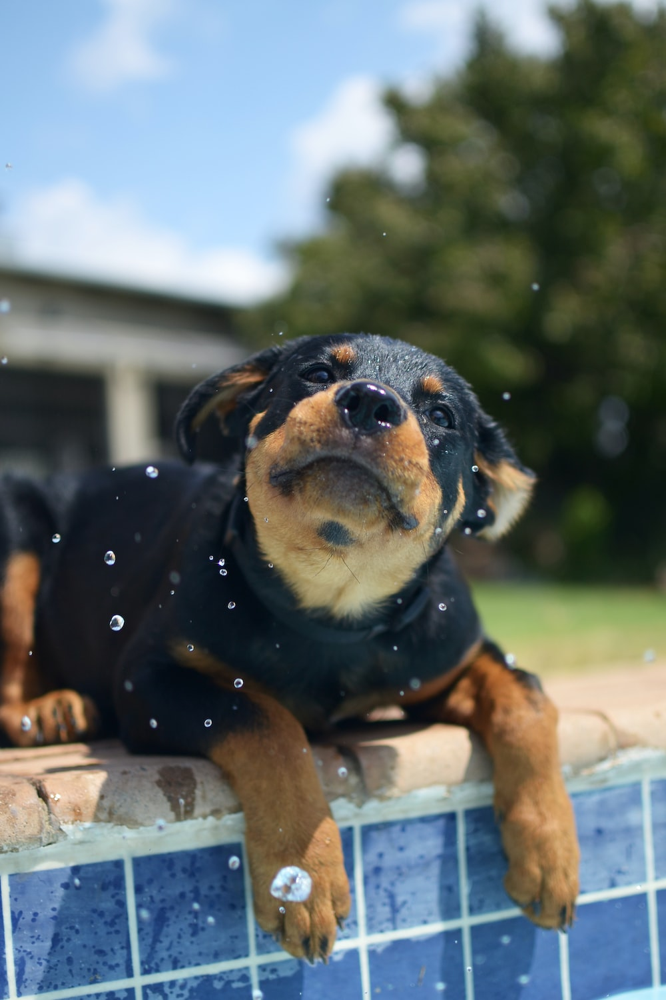

1/1 [==============================] - 0s 69ms/step
Real: rottweiler
Previsão: rottweiler
Probabilidade: 0.9808456




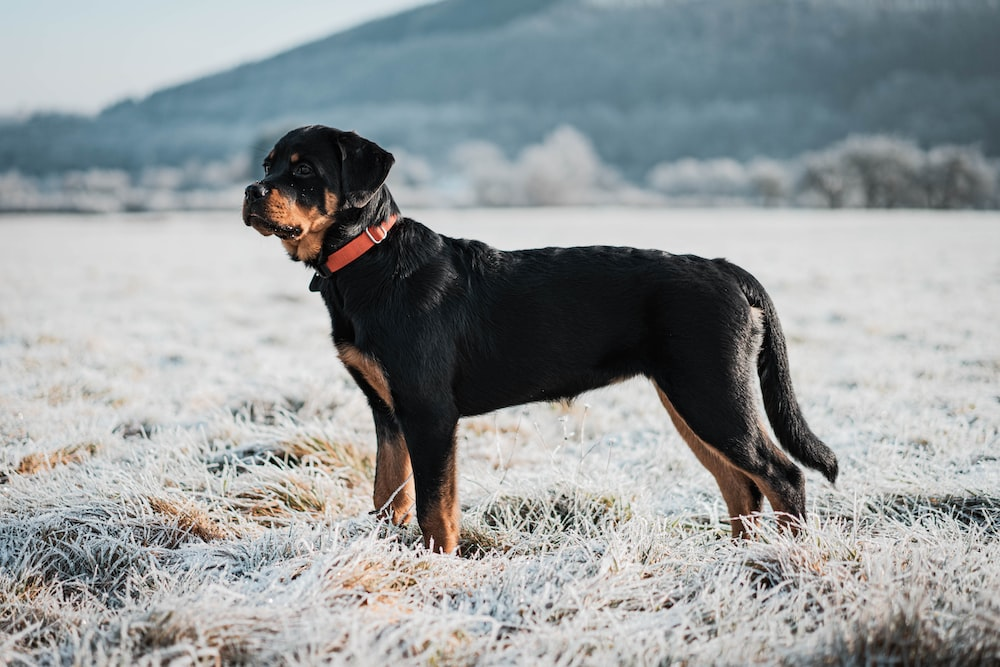

1/1 [==============================] - 0s 91ms/step
Real: rottweiler
Previsão: rottweiler
Probabilidade: 0.9222061




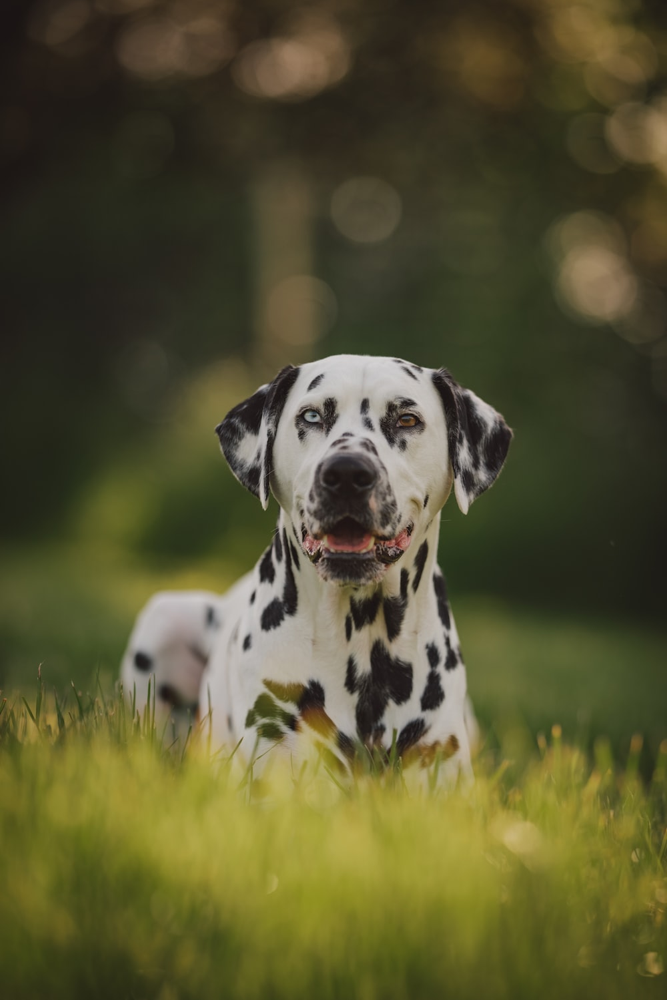

1/1 [==============================] - 0s 124ms/step
Real: dalmatian
Previsão: dalmatian
Probabilidade: 0.79679465




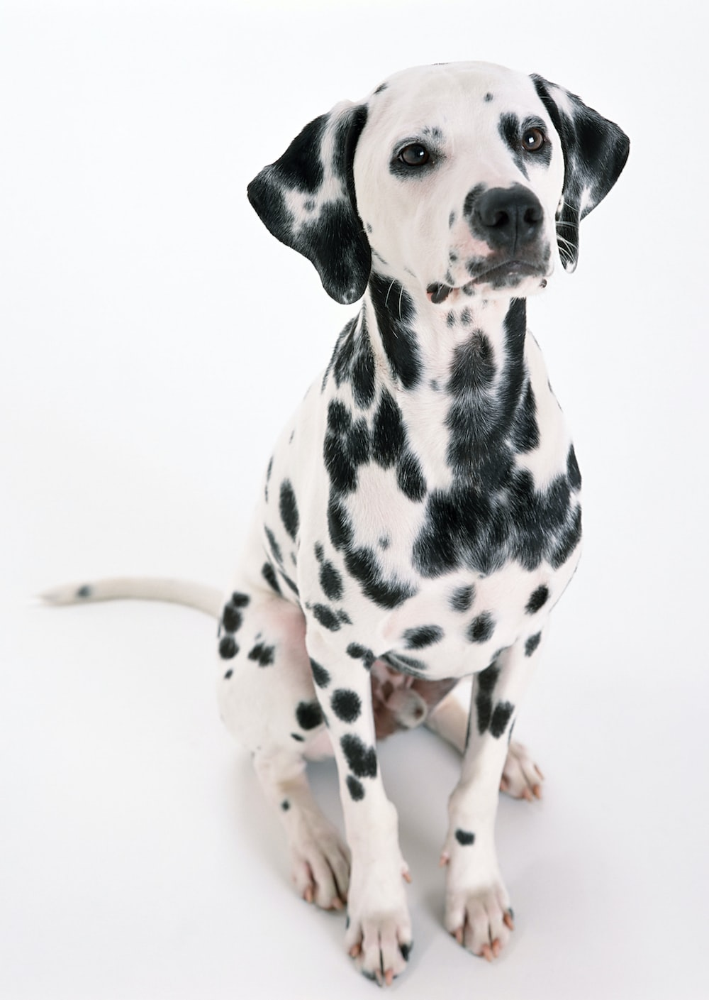

1/1 [==============================] - 0s 121ms/step
Real: dalmatian
Previsão: dalmatian
Probabilidade: 0.9857678




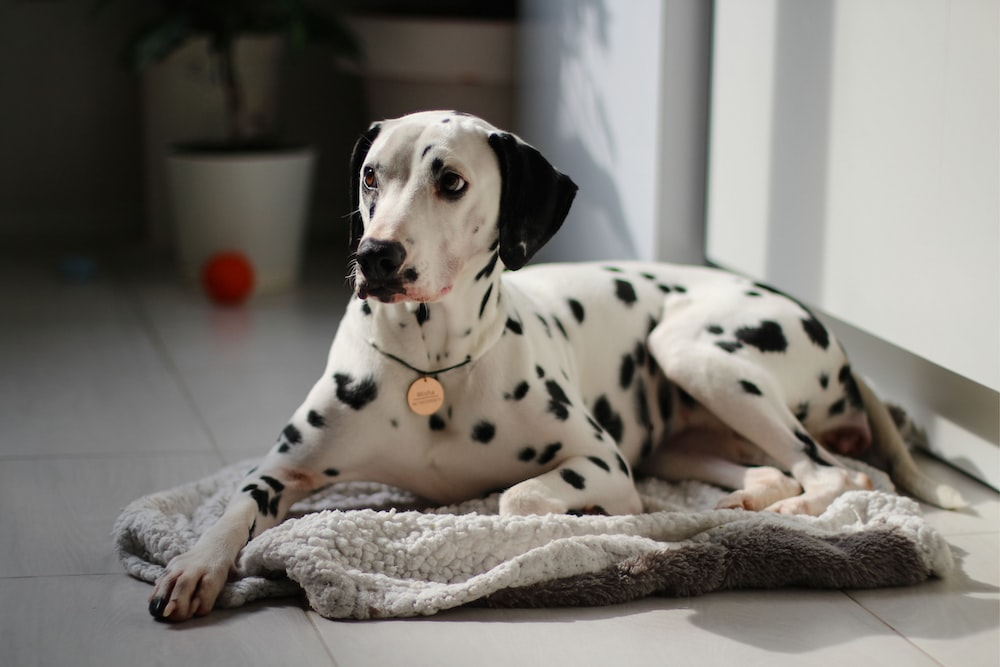

1/1 [==============================] - 0s 81ms/step
Real: dalmatian
Previsão: dalmatian
Probabilidade: 0.7031011




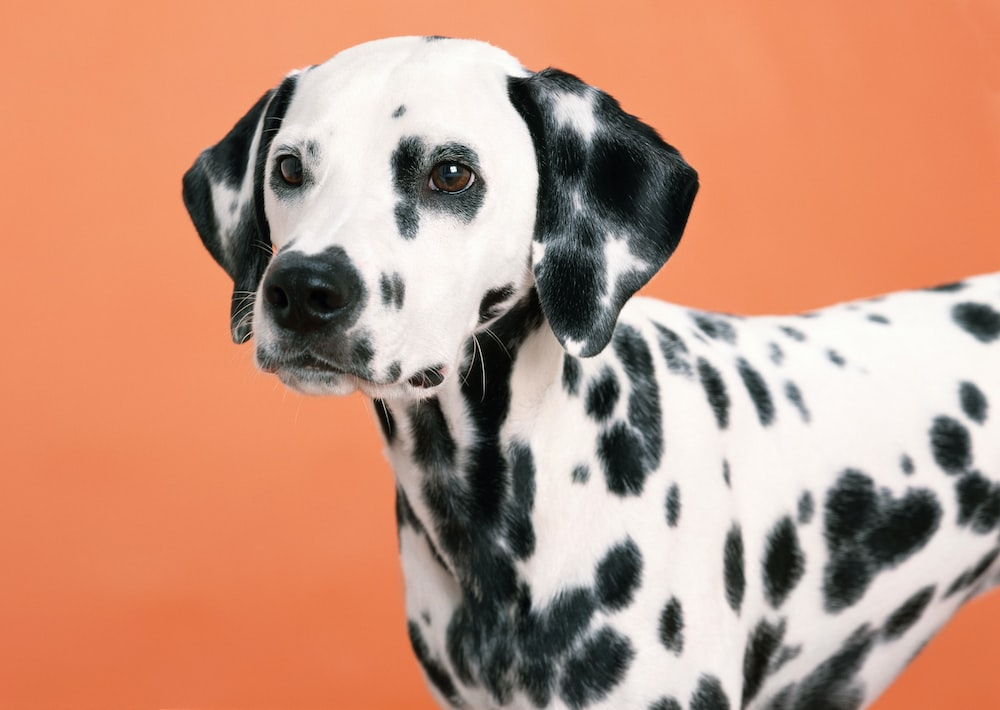

1/1 [==============================] - 0s 111ms/step
Real: dalmatian
Previsão: dalmatian
Probabilidade: 0.9939594




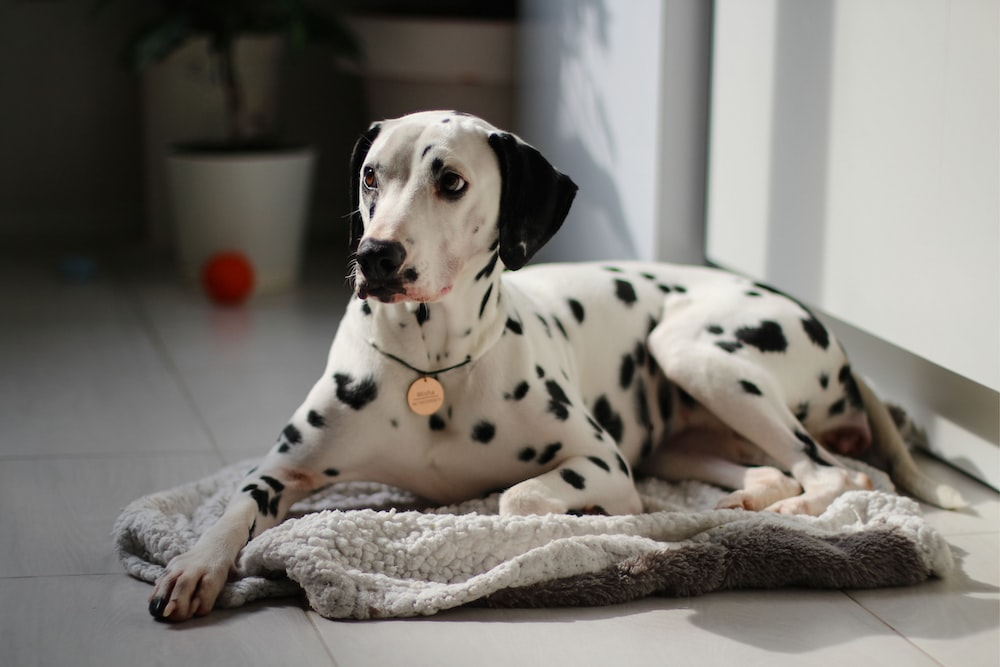

1/1 [==============================] - 0s 119ms/step
Real: dalmatian
Previsão: dalmatian
Probabilidade: 0.7031011




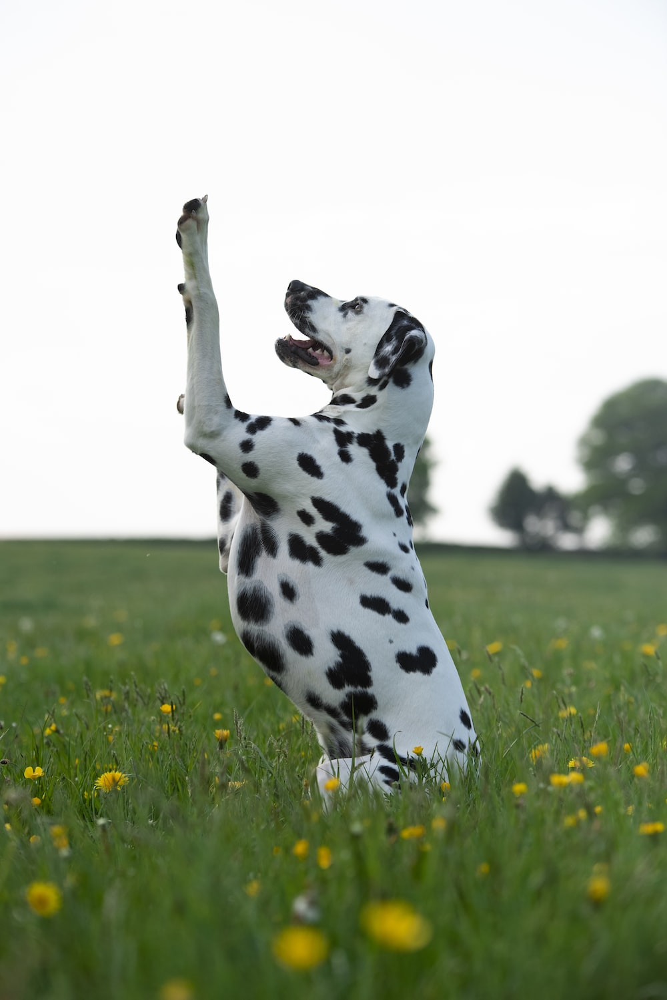

1/1 [==============================] - 0s 105ms/step
Real: dalmatian
Previsão: dalmatian
Probabilidade: 0.991045




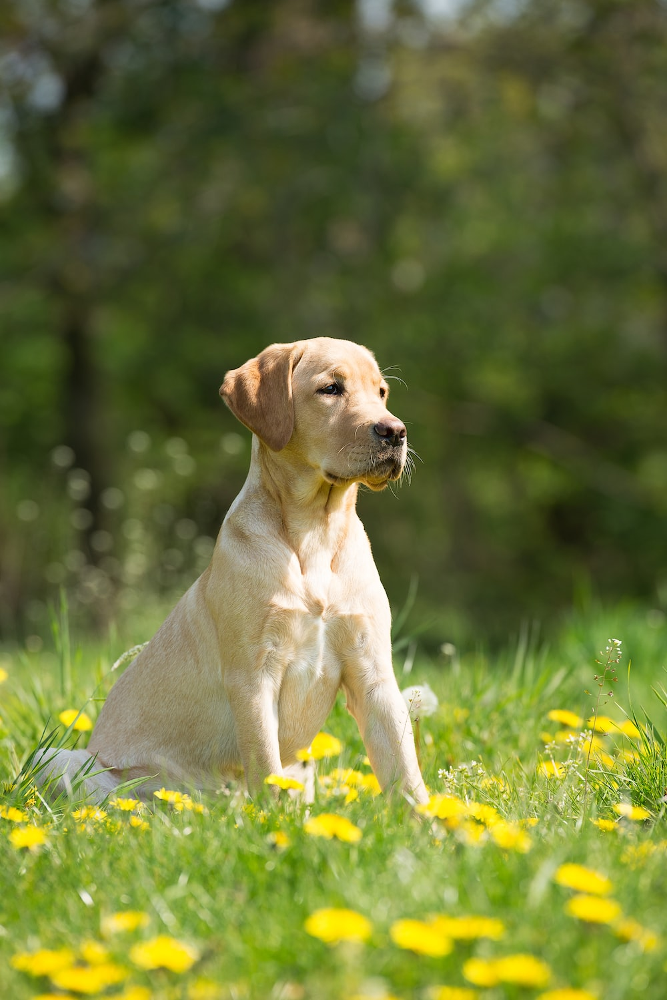

1/1 [==============================] - 0s 76ms/step
Real: labrador-retriever
Previsão: labrador-retriever
Probabilidade: 0.4743886




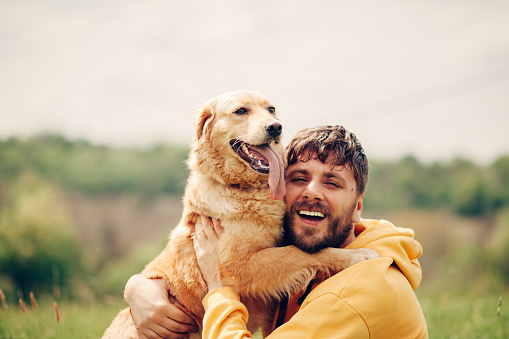

1/1 [==============================] - 0s 95ms/step
Real: labrador-retriever
Previsão: poodle
Probabilidade: 0.3470372




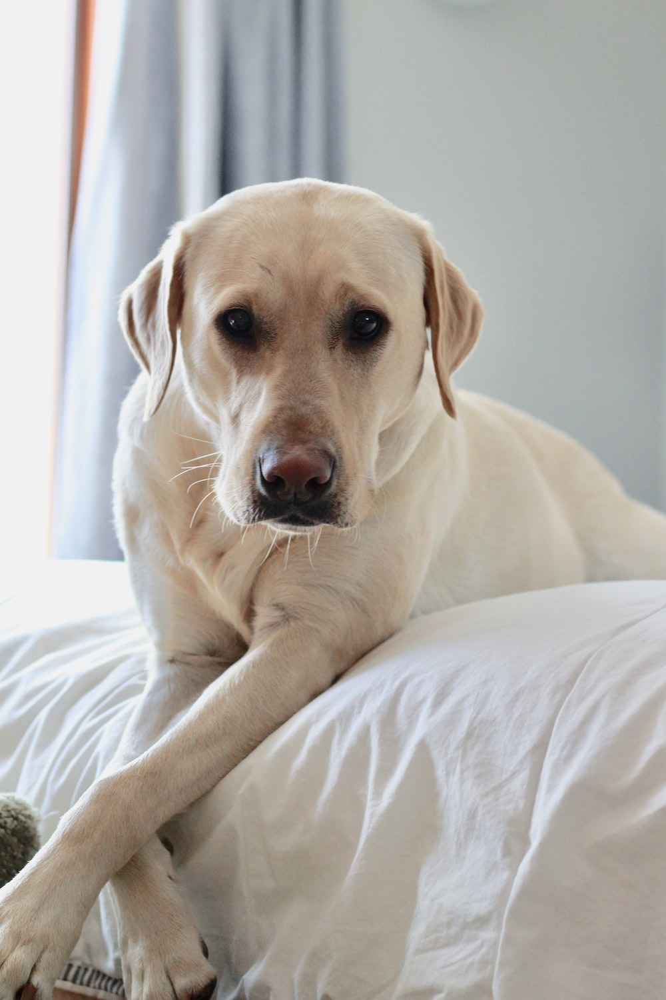

1/1 [==============================] - 0s 83ms/step
Real: labrador-retriever
Previsão: bulldog
Probabilidade: 0.20571607




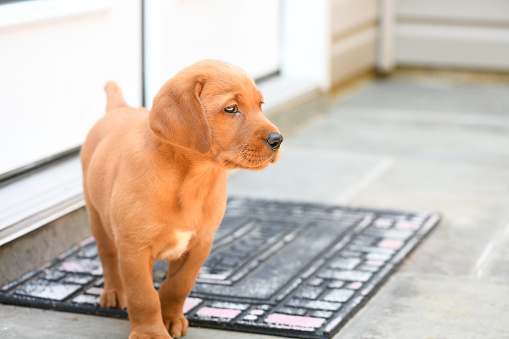

1/1 [==============================] - 0s 76ms/step
Real: labrador-retriever
Previsão: beagle
Probabilidade: 0.60484356




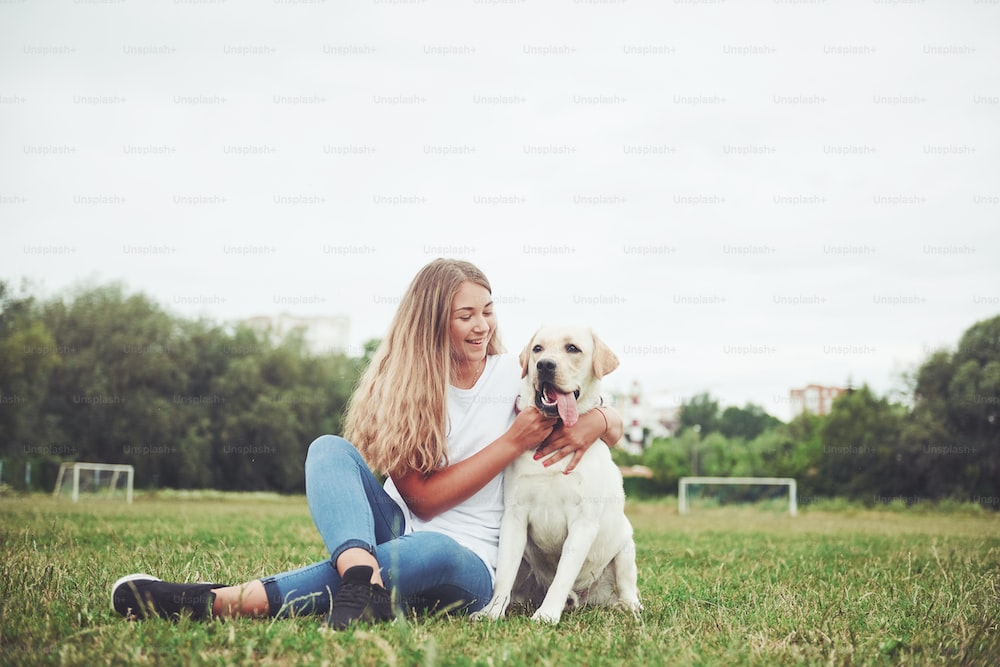

1/1 [==============================] - 0s 88ms/step
Real: labrador-retriever
Previsão: beagle
Probabilidade: 0.25161898




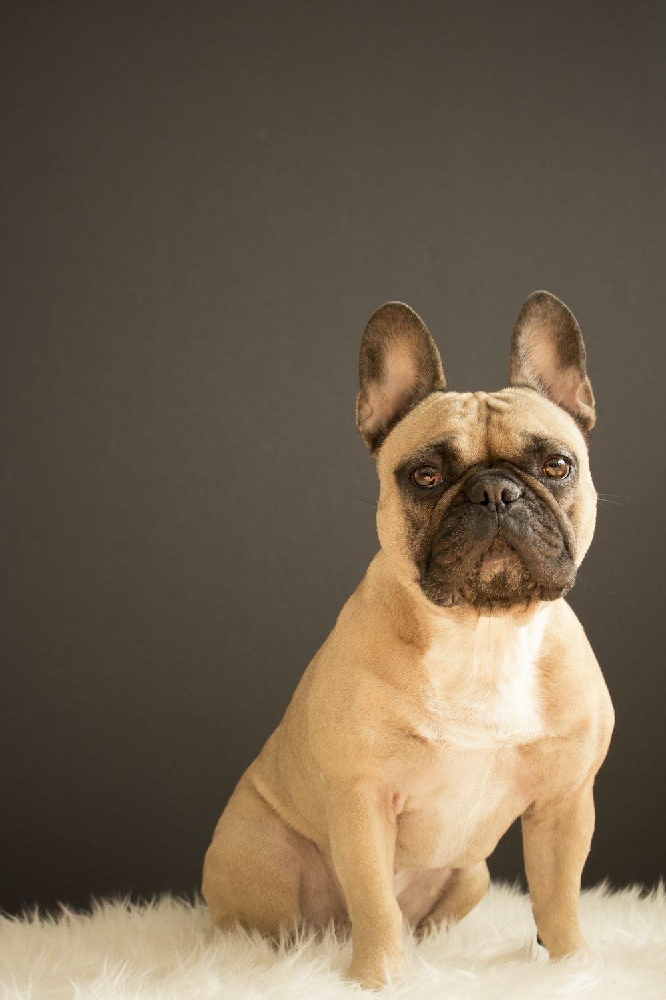

1/1 [==============================] - 0s 73ms/step
Real: bulldog
Previsão: labrador-retriever
Probabilidade: 0.57516444




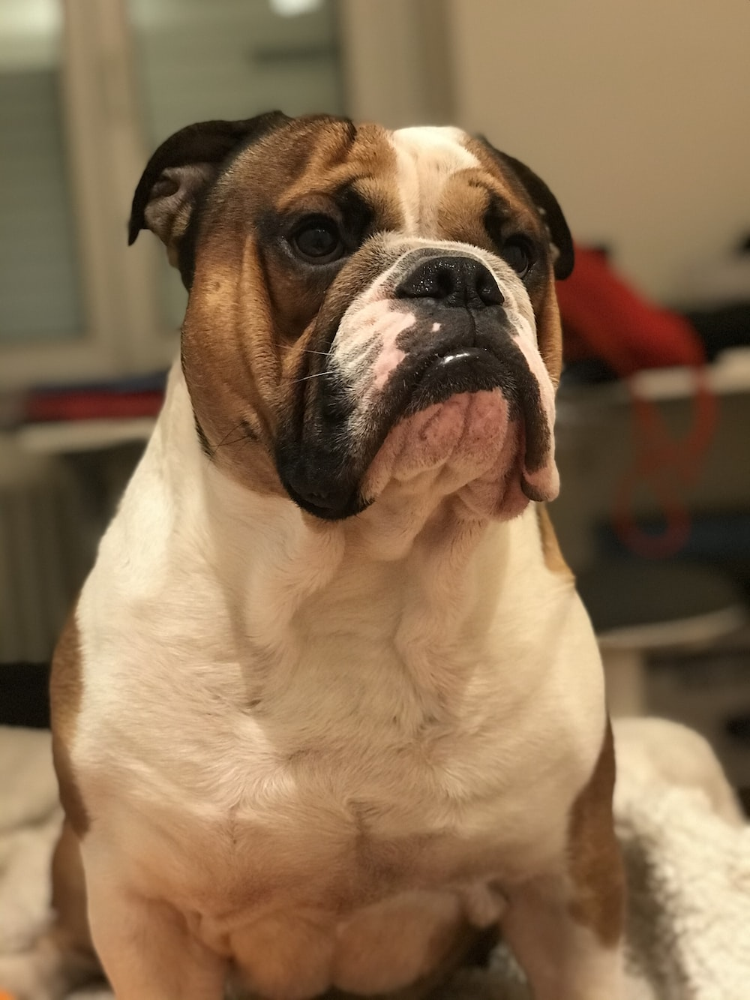

1/1 [==============================] - 0s 72ms/step
Real: bulldog
Previsão: beagle
Probabilidade: 0.4215618




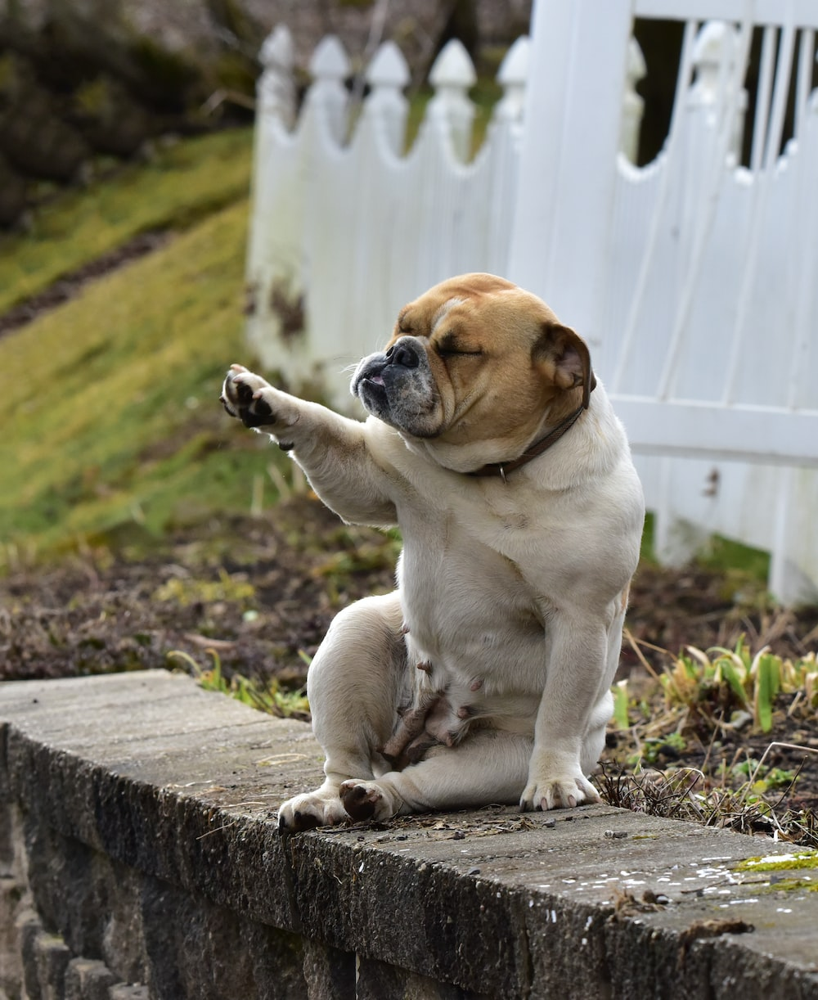

1/1 [==============================] - 0s 79ms/step
Real: bulldog
Previsão: bulldog
Probabilidade: 0.39247873




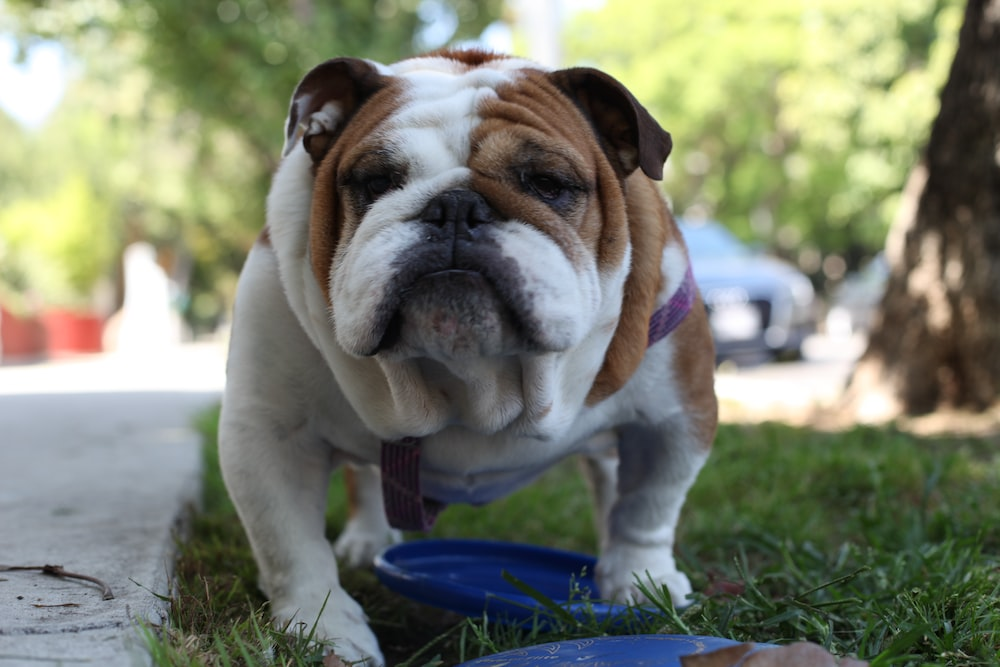

1/1 [==============================] - 0s 94ms/step
Real: bulldog
Previsão: bulldog
Probabilidade: 0.640227




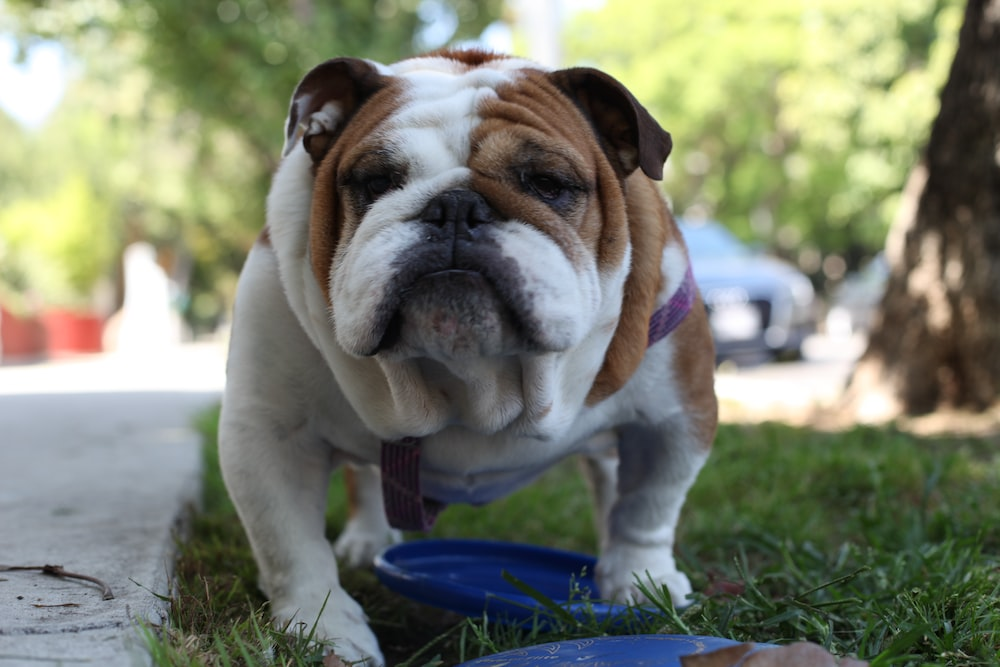

1/1 [==============================] - 0s 74ms/step
Real: bulldog
Previsão: bulldog
Probabilidade: 0.640227




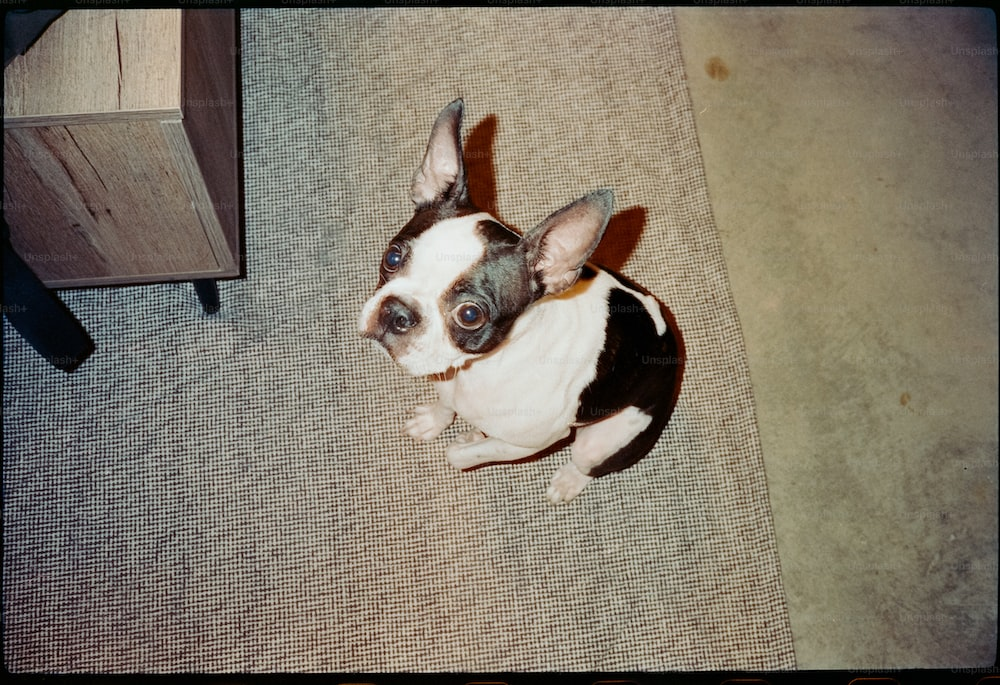

1/1 [==============================] - 0s 92ms/step
Real: bulldog
Previsão: beagle
Probabilidade: 0.43270603




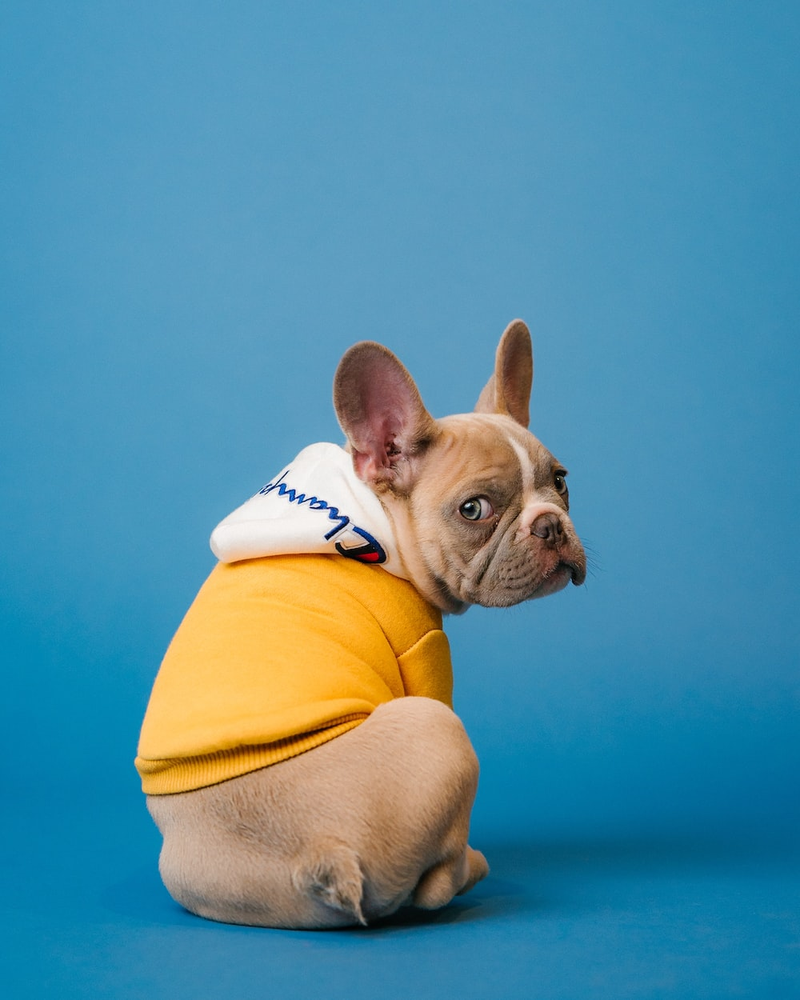

1/1 [==============================] - 0s 76ms/step
Real: bulldog
Previsão: bulldog
Probabilidade: 0.9999999




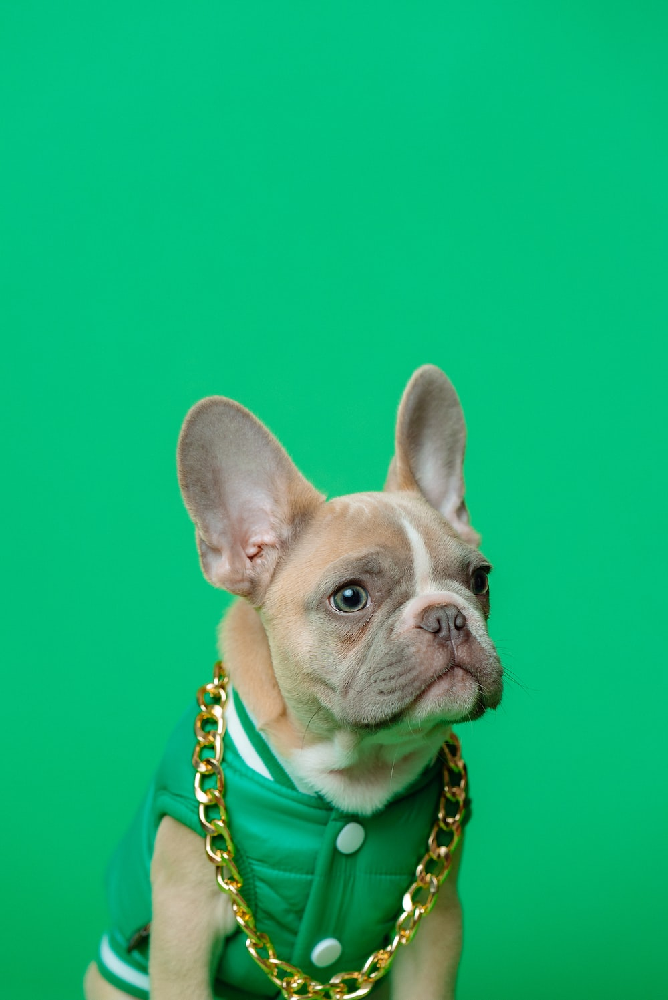

1/1 [==============================] - 0s 73ms/step
Real: bulldog
Previsão: bulldog
Probabilidade: 1.0




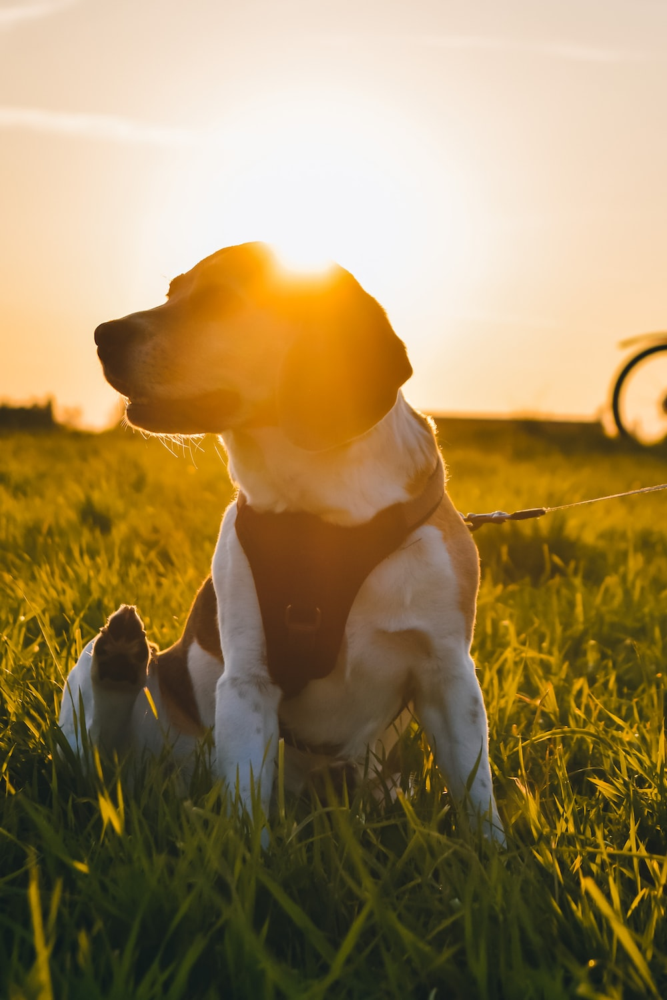

1/1 [==============================] - 0s 74ms/step
Real: beagle
Previsão: beagle
Probabilidade: 0.9308275




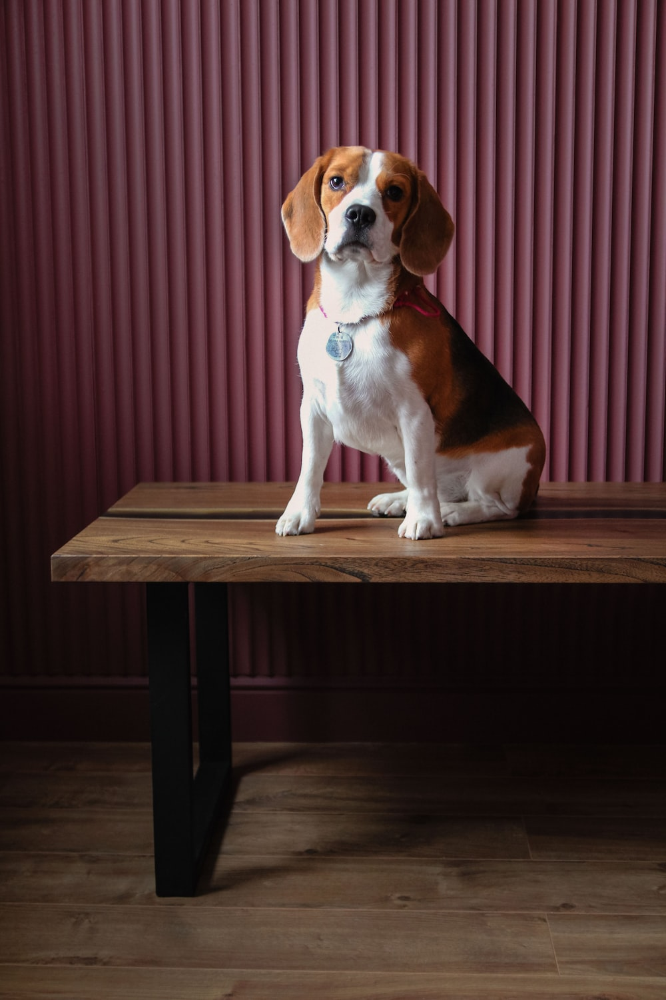

1/1 [==============================] - 0s 77ms/step
Real: beagle
Previsão: beagle
Probabilidade: 0.9529771




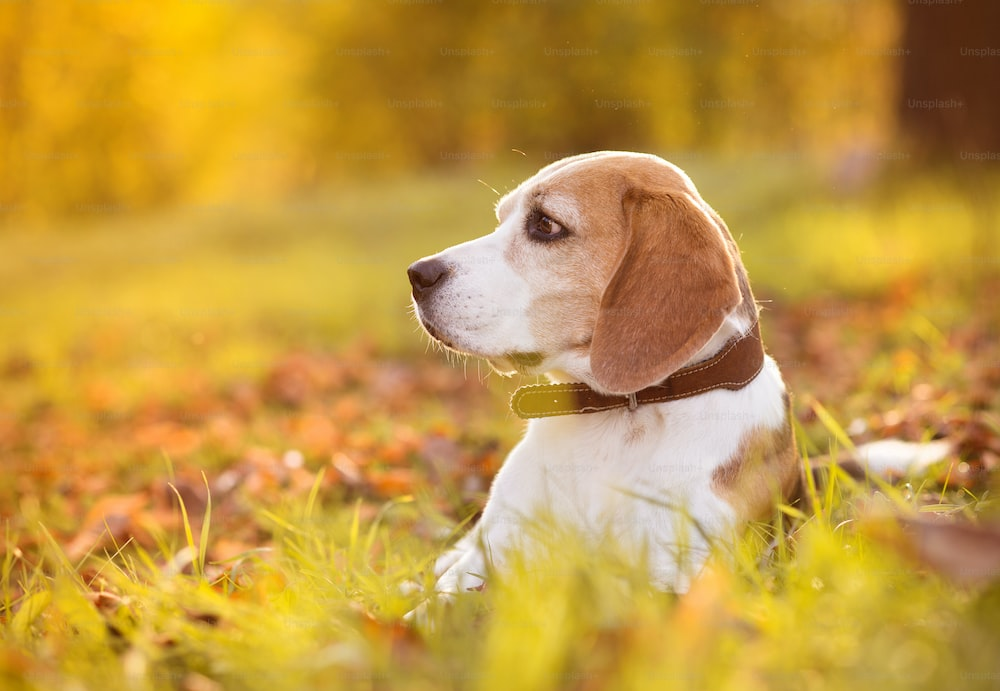

1/1 [==============================] - 0s 75ms/step
Real: beagle
Previsão: beagle
Probabilidade: 0.6346037




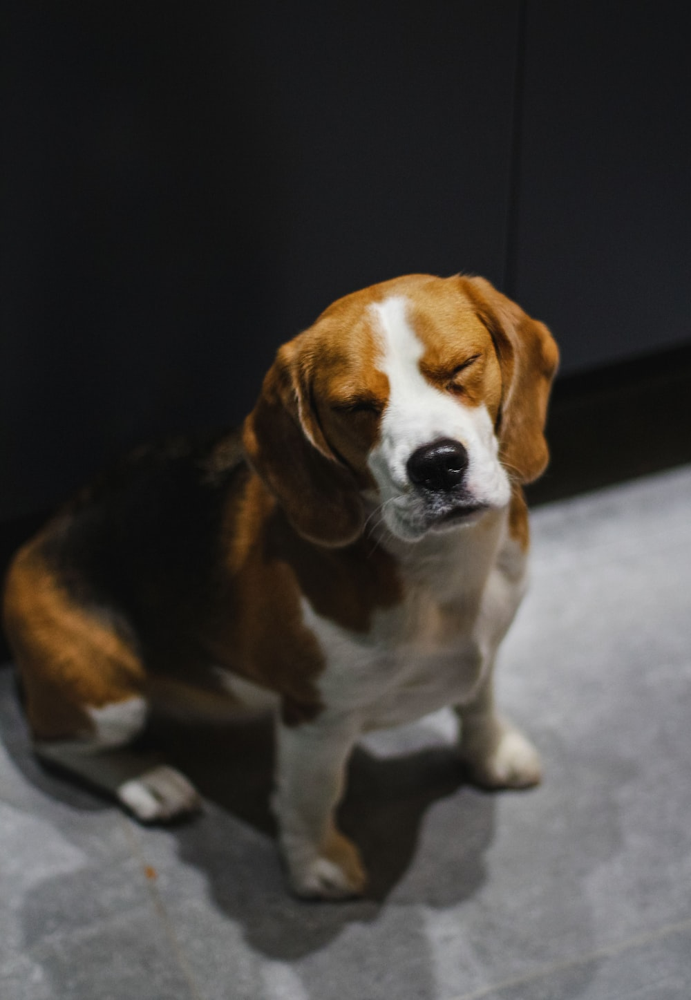

1/1 [==============================] - 0s 80ms/step
Real: beagle
Previsão: beagle
Probabilidade: 0.8839268




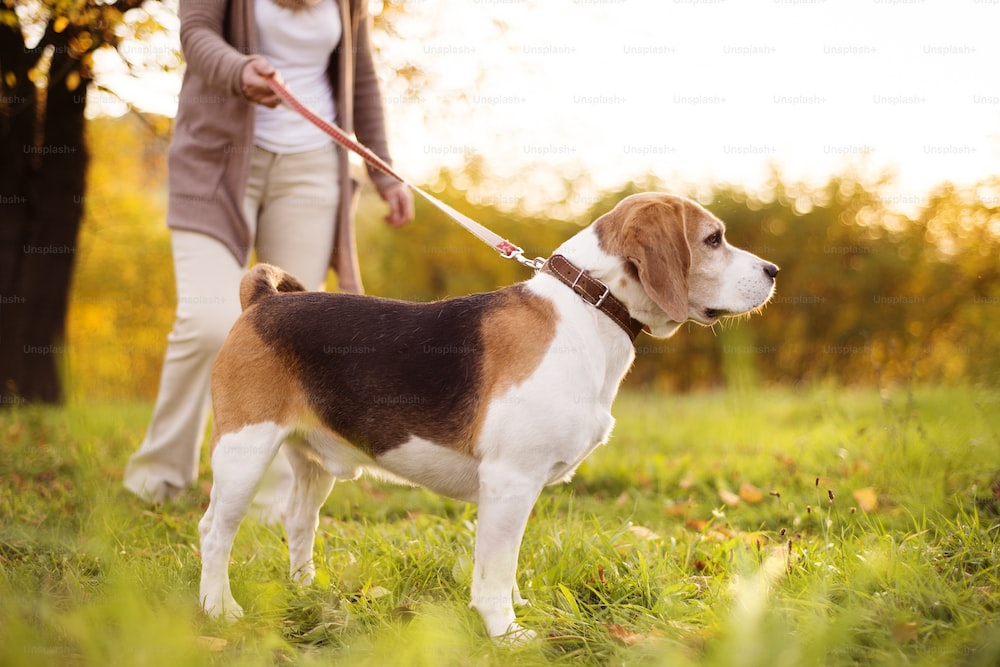

1/1 [==============================] - 0s 75ms/step
Real: beagle
Previsão: beagle
Probabilidade: 0.6993495




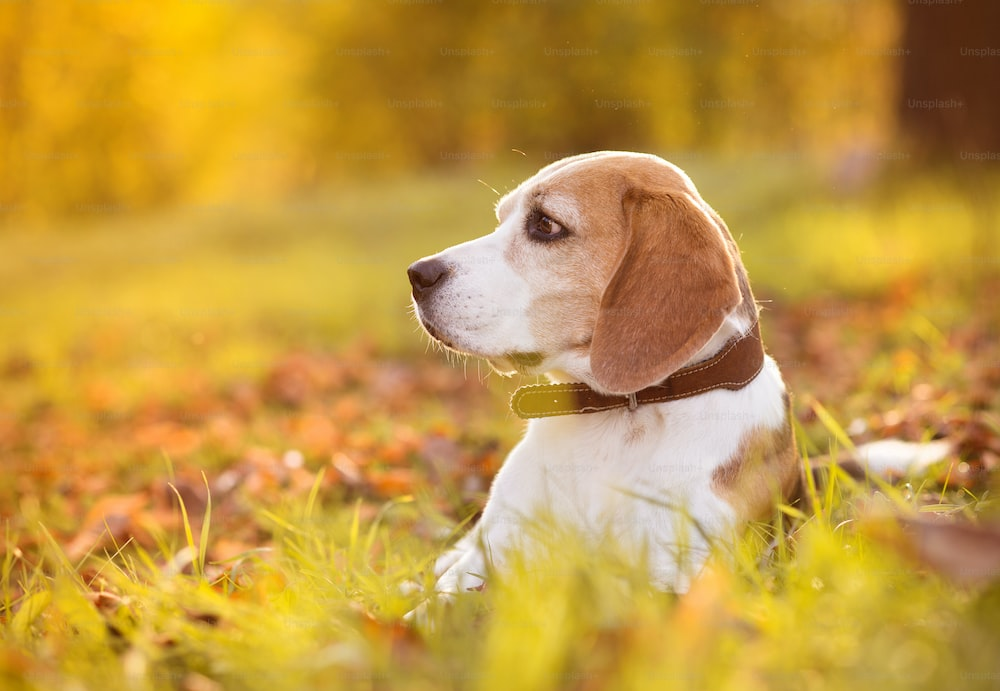

1/1 [==============================] - 0s 75ms/step
Real: beagle
Previsão: beagle
Probabilidade: 0.6346037




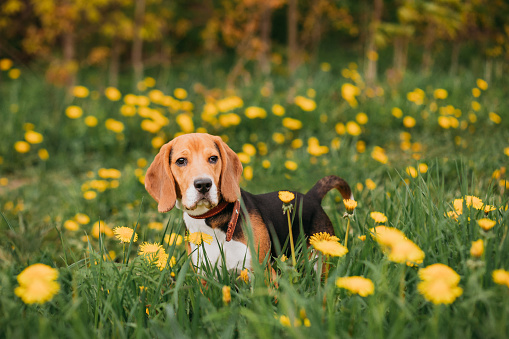

1/1 [==============================] - 0s 76ms/step
Real: beagle
Previsão: beagle
Probabilidade: 0.8066382




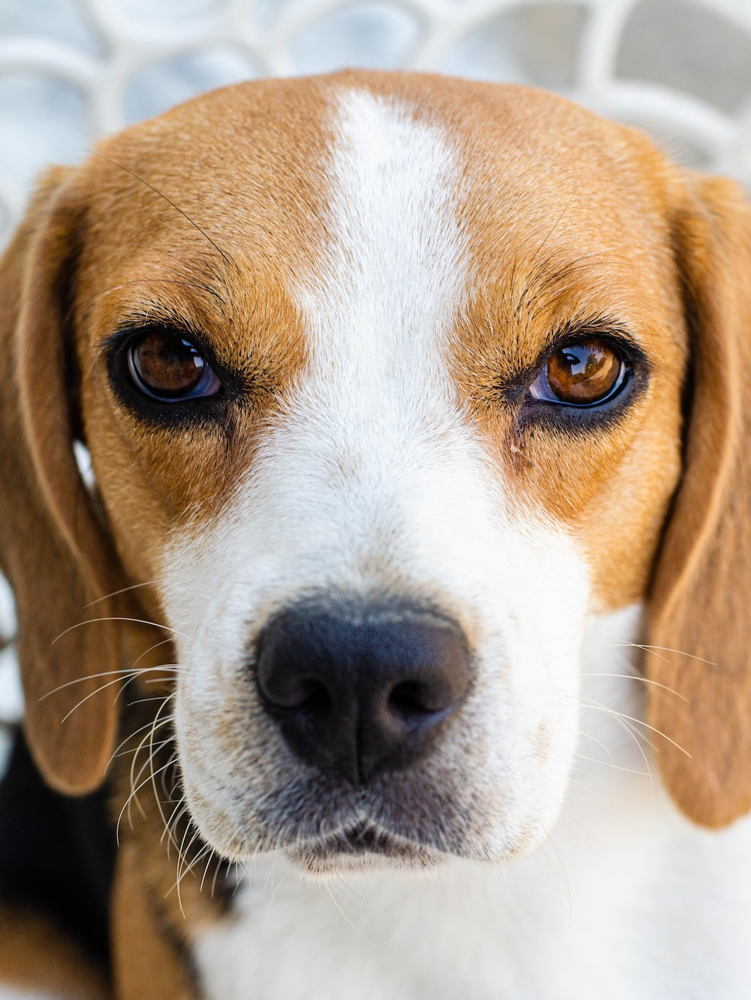

1/1 [==============================] - 0s 131ms/step
Real: beagle
Previsão: beagle
Probabilidade: 0.9018924




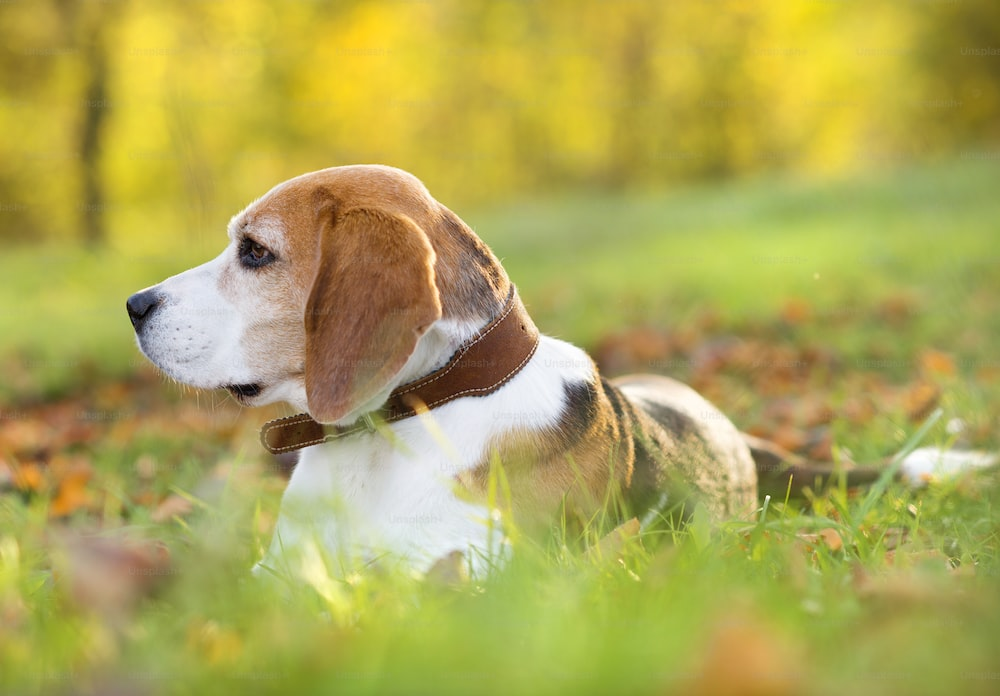

1/1 [==============================] - 0s 130ms/step
Real: beagle
Previsão: beagle
Probabilidade: 0.6811246




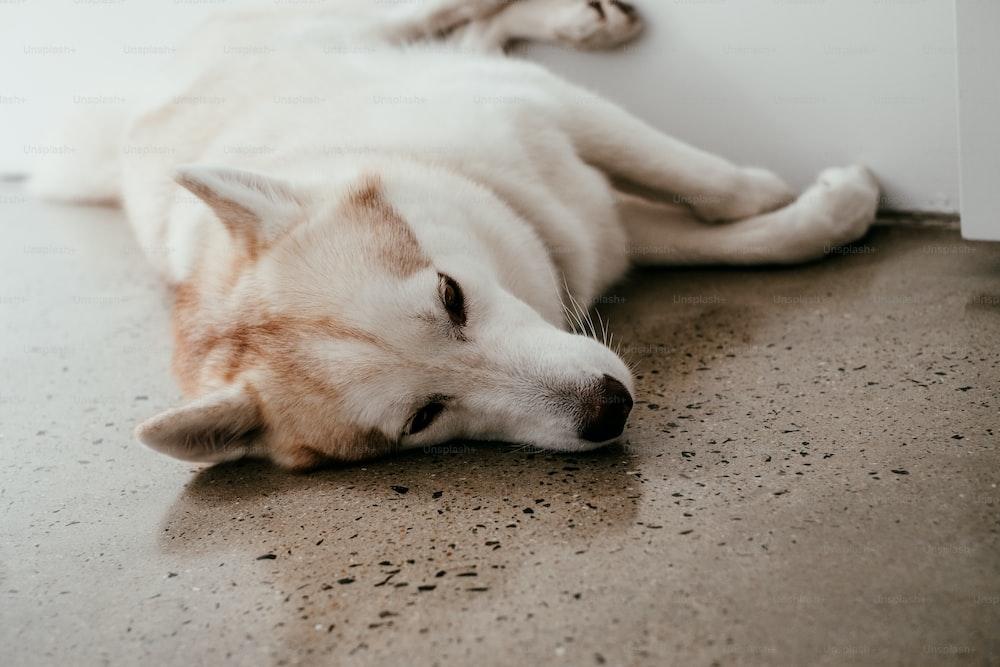

1/1 [==============================] - 0s 135ms/step
Real: husky
Previsão: german-shepherd
Probabilidade: 0.38422203




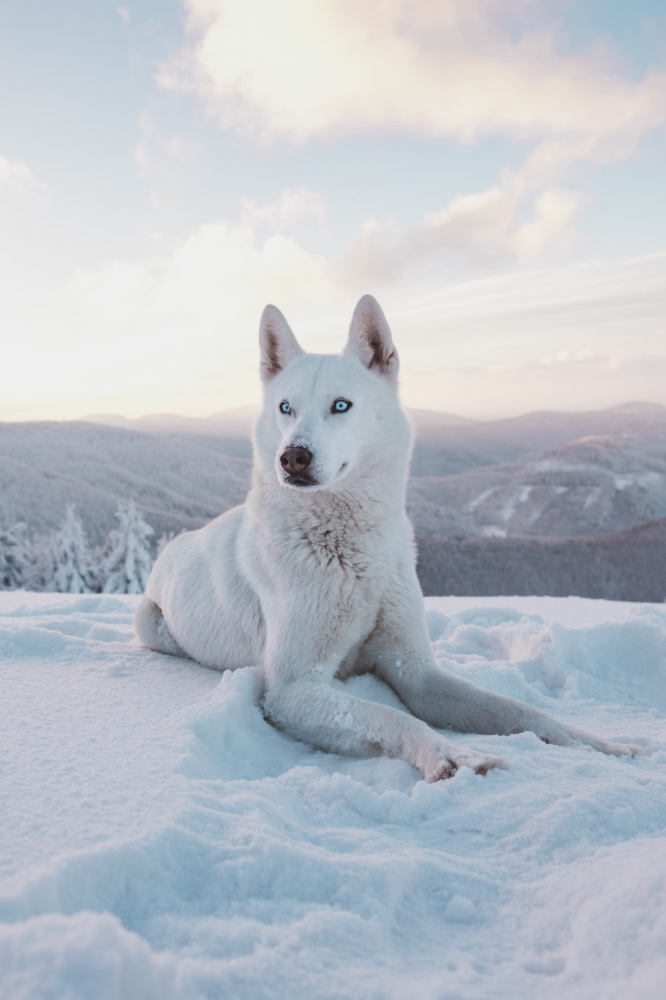

1/1 [==============================] - 0s 98ms/step
Real: husky
Previsão: husky
Probabilidade: 0.4154756




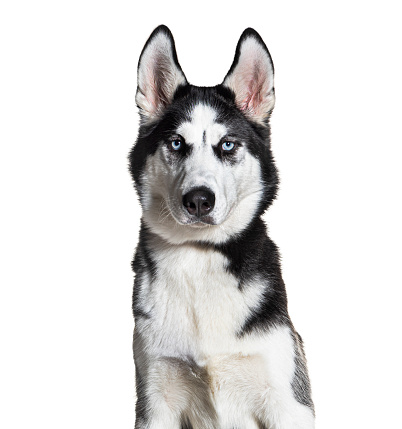

1/1 [==============================] - 0s 97ms/step
Real: husky
Previsão: dalmatian
Probabilidade: 0.61808664




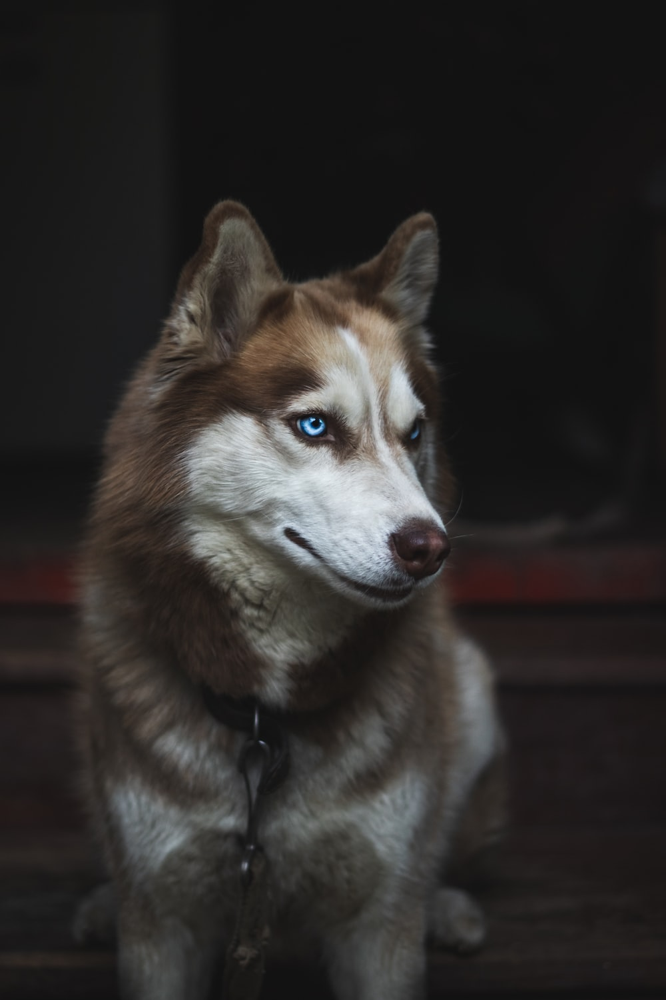

1/1 [==============================] - 0s 115ms/step
Real: husky
Previsão: husky
Probabilidade: 0.29328638




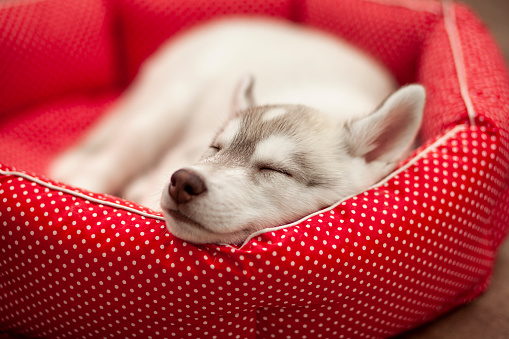

1/1 [==============================] - 0s 130ms/step
Real: husky
Previsão: dalmatian
Probabilidade: 0.5258676




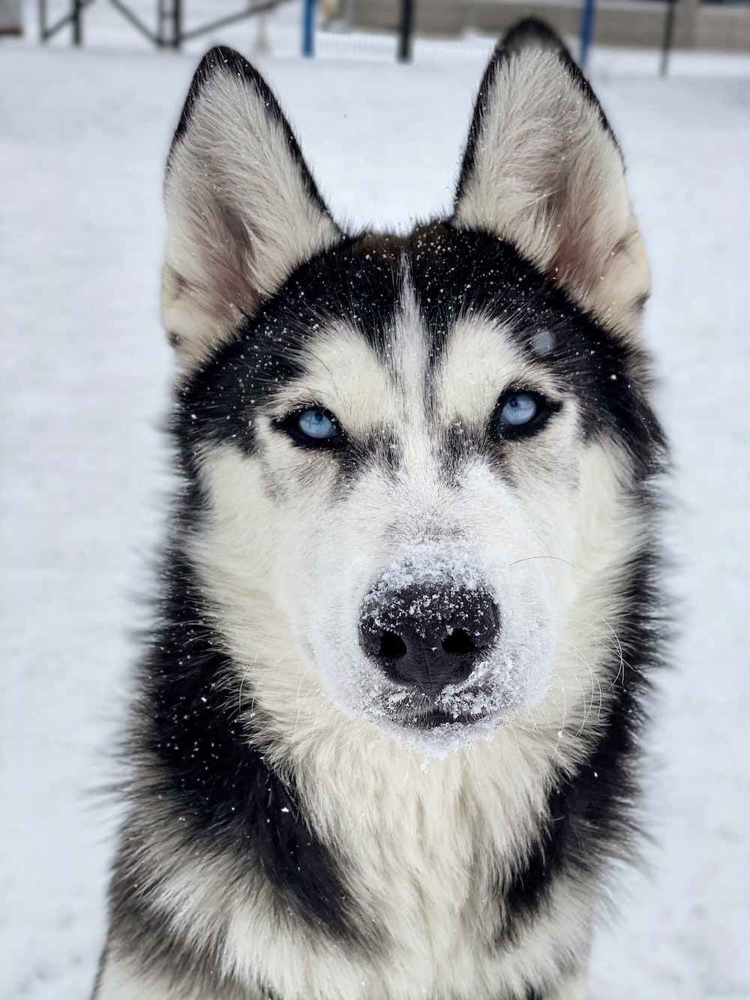

1/1 [==============================] - 0s 96ms/step
Real: husky
Previsão: dalmatian
Probabilidade: 0.9446302




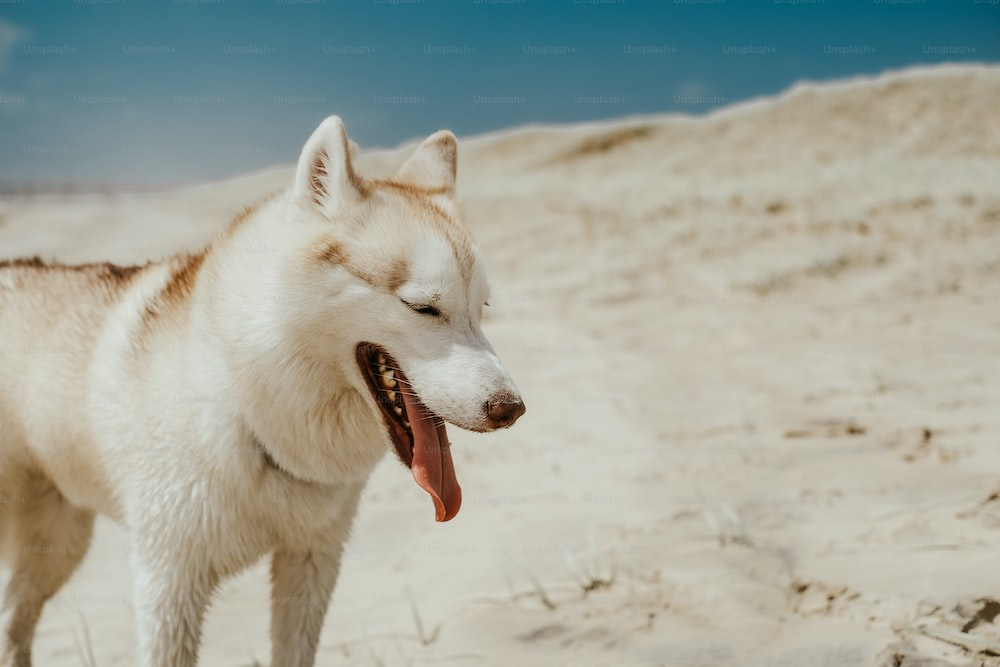

1/1 [==============================] - 0s 95ms/step
Real: husky
Previsão: husky
Probabilidade: 0.84714985




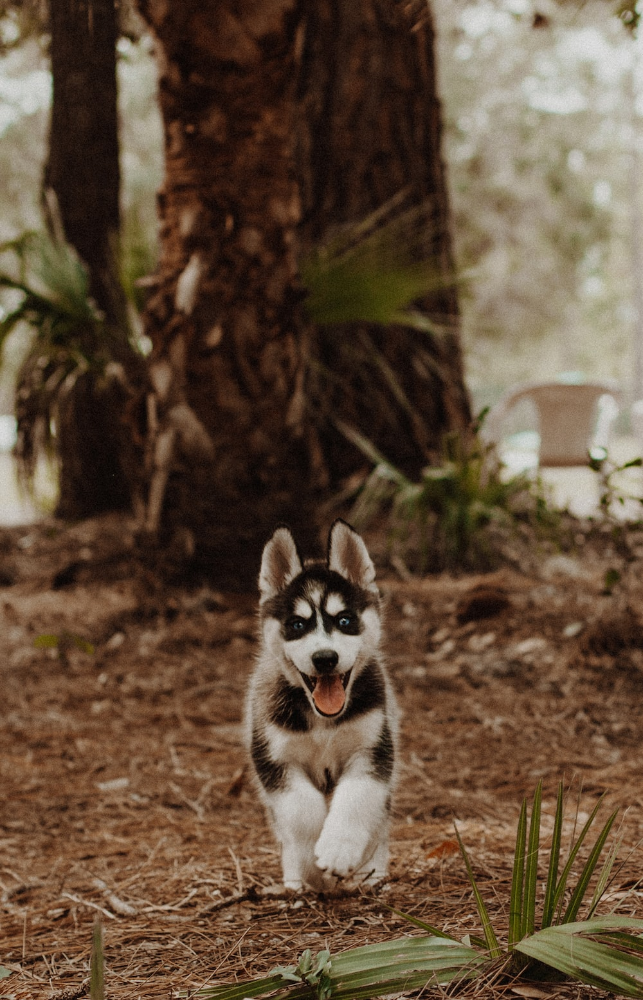

1/1 [==============================] - 0s 75ms/step
Real: husky
Previsão: husky
Probabilidade: 0.35174072




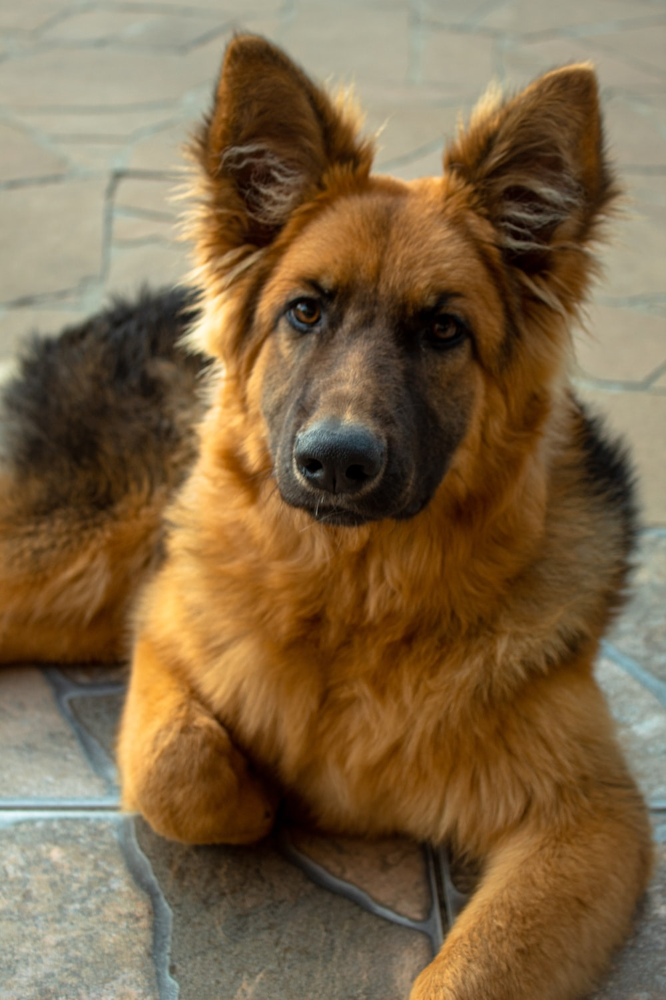

1/1 [==============================] - 0s 75ms/step
Real: german-shepherd
Previsão: beagle
Probabilidade: 0.6089725




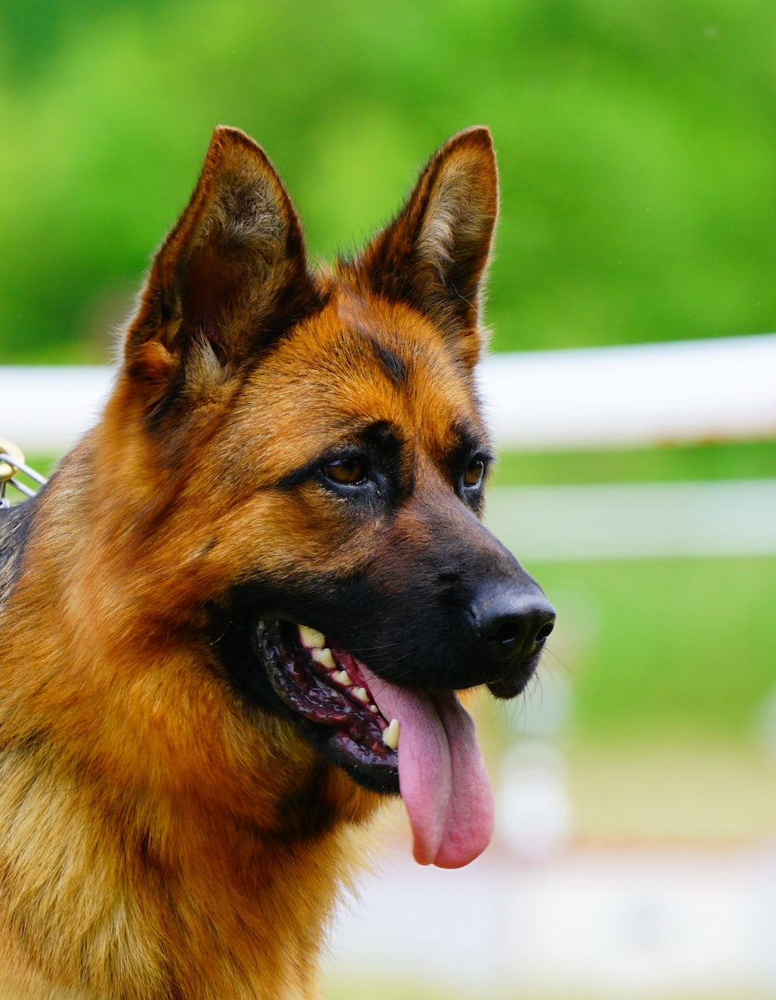

1/1 [==============================] - 0s 75ms/step
Real: german-shepherd
Previsão: beagle
Probabilidade: 0.5293238




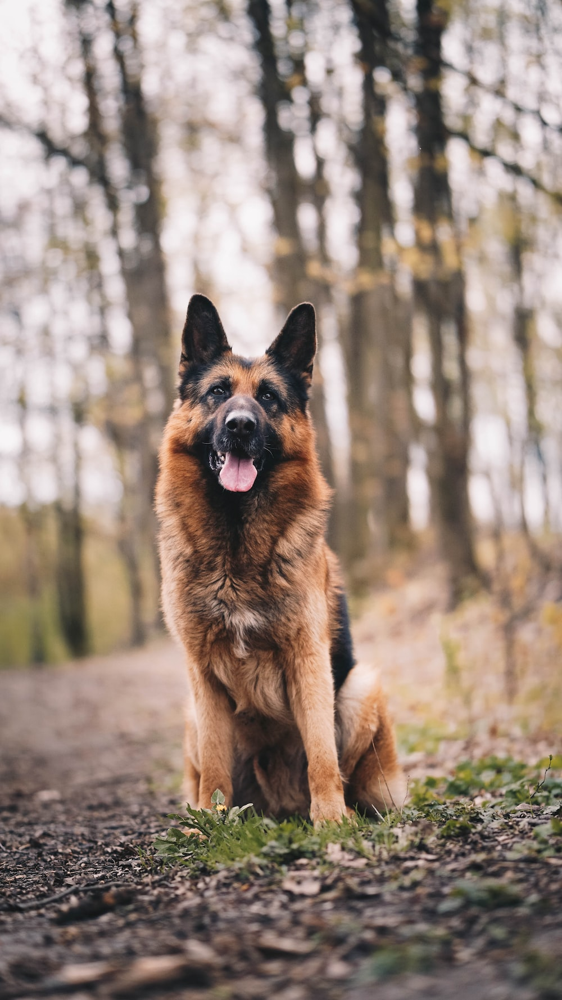

1/1 [==============================] - 0s 74ms/step
Real: german-shepherd
Previsão: bulldog
Probabilidade: 0.3189206




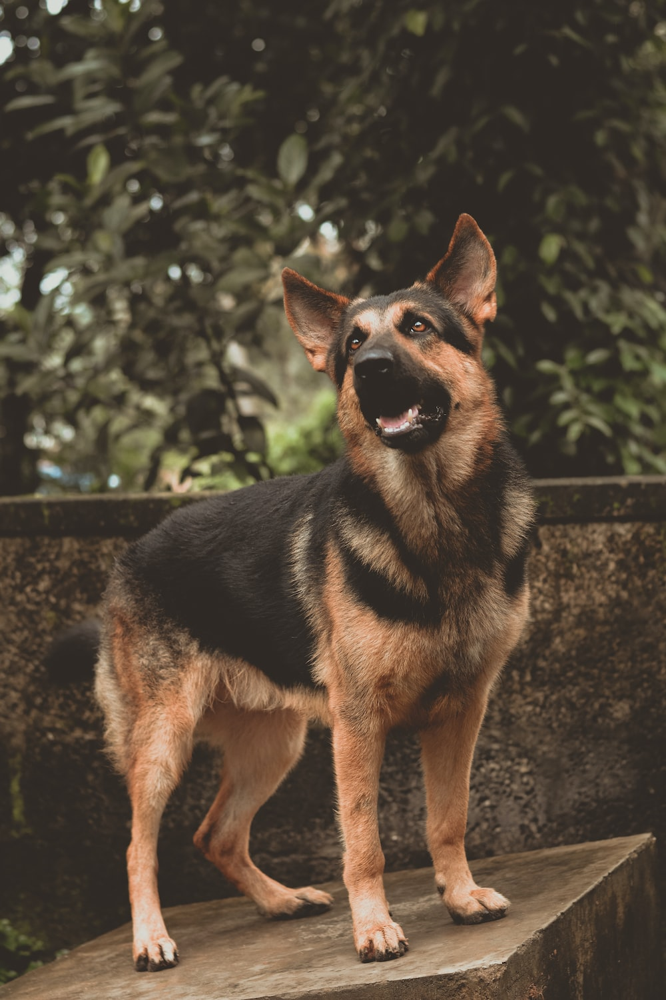

1/1 [==============================] - 0s 77ms/step
Real: german-shepherd
Previsão: german-shepherd
Probabilidade: 0.74291897




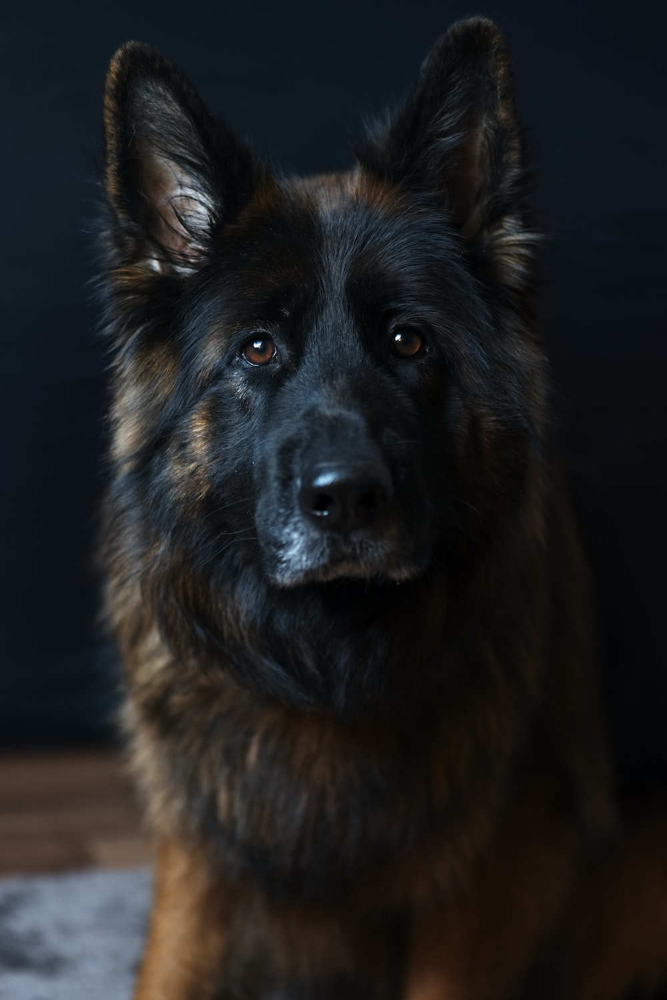

1/1 [==============================] - 0s 79ms/step
Real: german-shepherd
Previsão: german-shepherd
Probabilidade: 0.713052




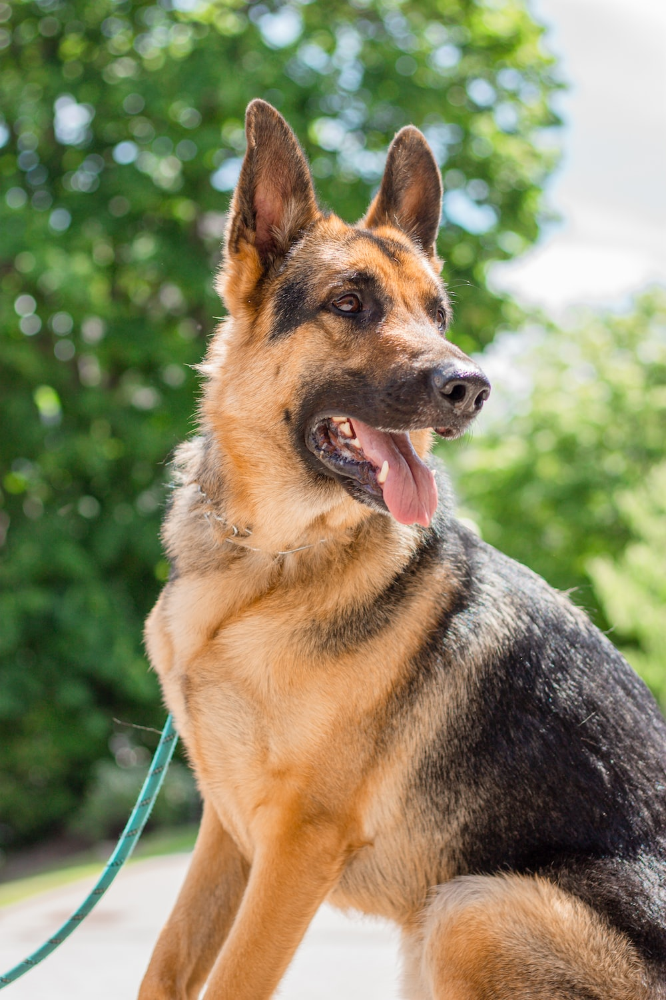

1/1 [==============================] - 0s 73ms/step
Real: german-shepherd
Previsão: bulldog
Probabilidade: 0.36267903




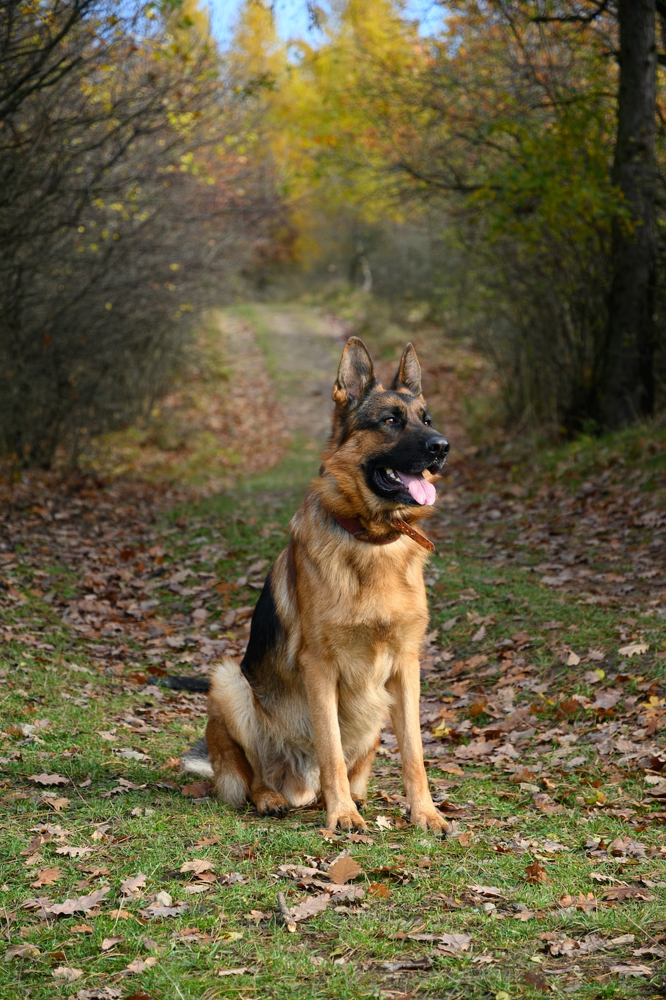

1/1 [==============================] - 0s 75ms/step
Real: german-shepherd
Previsão: beagle
Probabilidade: 0.31994748




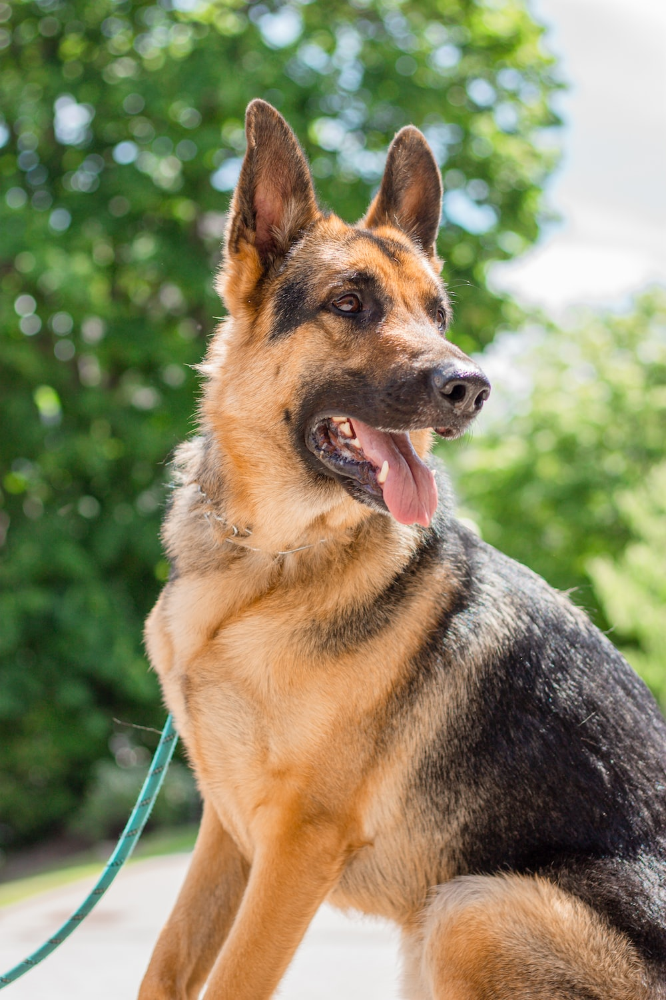

1/1 [==============================] - 0s 74ms/step
Real: german-shepherd
Previsão: bulldog
Probabilidade: 0.36267903




In [37]:
y_pred = list()
y_true = list()
count_images = 0
class_names = ['beagle', 'bulldog', 'dalmatian', 'german-shepherd', 'husky', 'labrador-retriever', 'poodle', 'rottweiler']
for file, label in test_df.values:
    if file.endswith('.png') or file.endswith('.jpg'):

            count_images+=1
            y_true.append(label)
            real = label
            img_path = file
            display(Image(filename=img_path, width=300))

            img = image.load_img(img_path, target_size=(img_height, img_width))
            x = image.img_to_array(img)
            x = np.expand_dims(x, axis=0)
            x = x.astype('float32') / 255.0

            # Previsão
            prediction = model.predict(x)

            # Printando as saídas do modelo
            predicted_class = np.argmax(prediction[0])
            probability = prediction[0][predicted_class]
            y_pred.append(class_names[predicted_class])
            print("Real:", real)
            print("Previsão:", class_names[predicted_class])
            print("Probabilidade:", probability)
            print("\n")

In [38]:
# Calculando as métricas
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.6101694915254238
Precision:  0.6487964677396383
Recall:  0.6101694915254238
F1 Score:  0.5889602864179135


Matriz de confusão sem normalização


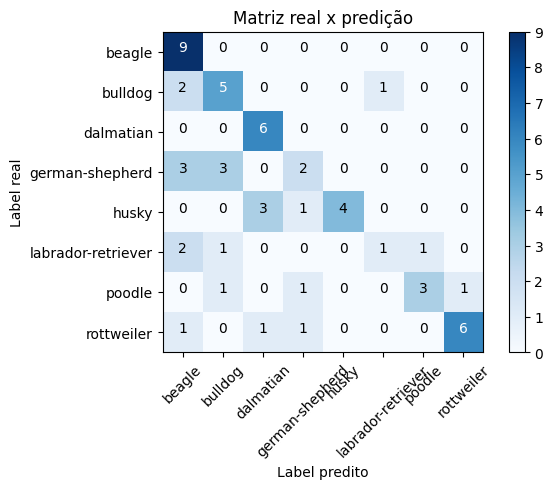

In [39]:
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['beagle', 'bulldog', 'dalmatian', 'german-shepherd', 'husky', 'labrador-retriever', 'poodle', 'rottweiler'],
                      normalize= False,
                      title='Matriz real x predição')